# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

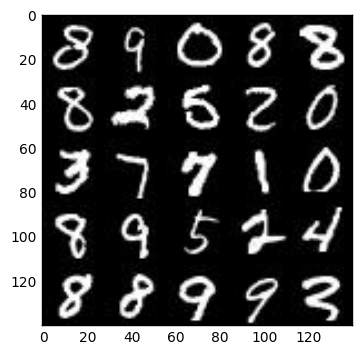

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

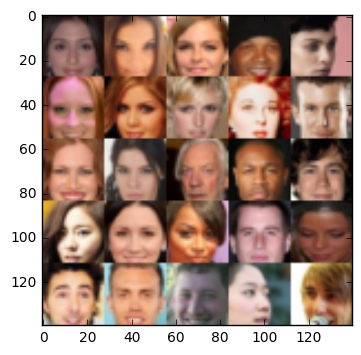

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.1
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """

    real_inputs_placeholder = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real') 
    z_inputs_placeholder = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    learning_rate_placeholder = tf.placeholder(tf.float32, shape=None)
    
    return real_inputs_placeholder, z_inputs_placeholder, learning_rate_placeholder
    


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the generator, tensor logits of the generator).

In [6]:
def discriminator(images, reuse=False, alpha=0.2, keep_prob=0.5):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # Standard deviation used to initialize convolution layers' kernerls.
    standard_deviation = 0.02
    
    with tf.variable_scope('discriminator', reuse=reuse):
        x1 = tf.layers.conv2d(images, 
                              64, 
                              5, 
                              strides=2, 
                              padding='same', 
                              kernel_initializer=tf.random_normal_initializer(stddev=standard_deviation))
        relu1 = tf.maximum(alpha * x1, x1)
        
        x2 = tf.layers.conv2d(relu1, 
                              128, 
                              5, 
                              strides=2, 
                              padding='same',
                             kernel_initializer=tf.random_normal_initializer(stddev=standard_deviation))
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        
        x3 = tf.layers.conv2d(relu2, 
                              256,
                              5,
                              strides=2, 
                              padding='same',
                             kernel_initializer=tf.random_normal_initializer(stddev=standard_deviation))
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        
        x4 = tf.layers.conv2d(relu3, 
                              512, 
                              5, 
                              strides=2, 
                              padding='same',
                             kernel_initializer=tf.random_normal_initializer(stddev=standard_deviation))
        bn4 = tf.layers.batch_normalization(x4, training=True)
        relu4 = tf.maximum(alpha * bn4, bn4)

        # Flatten it
        flat = tf.reshape(relu4, (-1, 2 * 2 * 512))
        logits = tf.layers.dense(flat, 1, kernel_initializer=tf.random_normal_initializer(stddev=standard_deviation))
        
        # Add dropout
        logits = tf.nn.dropout(logits, keep_prob)
        out = tf.sigmoid(logits)
        
        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True, alpha=0.2):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # Standard deviation used to initialize convolution layers' kernerls.
    
    standard_deviation = 0.02
    with tf.variable_scope('generator', reuse=(not is_train)):
        # First fully connected layer
        x1 = tf.layers.dense(z, 2*2*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 2, 2, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        # 7x7x512 now

        x2 = tf.layers.conv2d_transpose(x1,
                                        128,
                                        5, 
                                        strides=2, 
                                        padding='valid',
                                       kernel_initializer=tf.random_normal_initializer(stddev=standard_deviation))
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        
        x3 = tf.layers.conv2d_transpose(x2,
                                        64,
                                        5, 
                                        strides=2,
                                        padding='same',
                                       kernel_initializer=tf.random_normal_initializer(stddev=standard_deviation))
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3,
                                            out_channel_dim,
                                            5, 
                                            strides=2, 
                                            padding='same',
                                           kernel_initializer=tf.random_normal_initializer(stddev=standard_deviation))
        # 28x28x3 now
        out = tf.tanh(logits)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
import numpy as np 

def model_loss(input_real, input_z, out_channel_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, out_channel_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_model_real_labels = tf.ones_like(d_model_real) * np.random.uniform(0.7,1.2)
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=d_model_real_labels))
    
    d_model_fake_labels = tf.zeros_like(d_model_fake)
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=d_model_fake_labels))
    
    g_model_labels = tf.ones_like(d_model_fake) * np.random.uniform(0.7,1.2)
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=g_model_labels))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get the trainable_variables, split into G and D parts
    trainable_variables = tf.trainable_variables()
    generator_variables = [variable for variable in trainable_variables if variable.name.startswith('generator')]
    discriminator_variables = [variable for variable in trainable_variables if variable.name.startswith('discriminator')]

    discriminator_train_optimizer = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=discriminator_variables)
    generator_train_optimizer = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=generator_variables)
    
    return discriminator_train_optimizer, generator_train_optimizer


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    
    # First, let's build the model
    print("Shape: ", data_shape)
    input_real, input_z, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    sample_z = np.random.uniform(-1, 1, size=(50, z_dim))
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    samples = []
    losses = []
    
    # training
    with tf.Session() as sess:        
        sess.run(tf.global_variables_initializer())
        for e in range(epoch_count):
            batch_number = 0
            for batch_images in get_batches(batch_size):
                batch_number += 1
 
                batch_images = batch_images * 2
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))            
                
                
                sess.run(d_train_opt, feed_dict={input_real: batch_images, 
                                                 input_z: batch_z,
                                                 lr: learning_rate})
                
                # Train generator three times per batch
                sess.run(g_train_opt, feed_dict={input_real: batch_images, 
                                                 input_z: 
                                                 batch_z,
                                                 lr: learning_rate})
                sess.run(g_train_opt, feed_dict={input_real: batch_images, 
                                                 input_z: batch_z,
                                                 lr: learning_rate})
                sess.run(g_train_opt, feed_dict={input_real: batch_images,
                                                 input_z: batch_z,
                                                 lr: learning_rate})
                
                
                # show output every 100 batches
                if batch_number % 100 == 0:
                    show_generator_output(sess, 25, input_z, data_shape[3], data_image_mode)

                # print loss every epoch 
                train_loss_d = sess.run(d_loss, {input_z: batch_z,
                                                 input_real: batch_images})
                train_loss_g = g_loss.eval({input_z: batch_z})
                
                if batch_number % 10 == 0:
                    print("Epoch {}/{}...".format(e + 1, epoch_count),
                      "Discriminator Loss: {:.4f}...".format(train_loss_d),
                      "Generator Loss: {:.4f}".format(train_loss_g))    
                    # save loss
                    losses.append((train_loss_d, train_loss_g))

                    # sample from generator 
                    gen_samples = sess.run(
                                   generator(input_z, data_shape[3], is_train=False),
                                   feed_dict={input_real: batch_images, input_z: sample_z, lr: learning_rate})
                    samples.append(gen_samples)
        show_generator_output(sess, 9, input_z, data_shape[3], data_image_mode)
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

(60000, 28, 28, 1)
Epoch 1/2... Discriminator Loss: 2.1570... Generator Loss: 0.4936
Epoch 1/2... Discriminator Loss: 1.8339... Generator Loss: 0.7610
Epoch 1/2... Discriminator Loss: 1.3670... Generator Loss: 1.6326
Epoch 1/2... Discriminator Loss: 1.3109... Generator Loss: 1.2955
Epoch 1/2... Discriminator Loss: 1.6275... Generator Loss: 0.6308
Epoch 1/2... Discriminator Loss: 1.7874... Generator Loss: 0.8062
Epoch 1/2... Discriminator Loss: 1.3754... Generator Loss: 0.9539
Epoch 1/2... Discriminator Loss: 1.2436... Generator Loss: 1.1106
Epoch 1/2... Discriminator Loss: 1.3468... Generator Loss: 0.9425


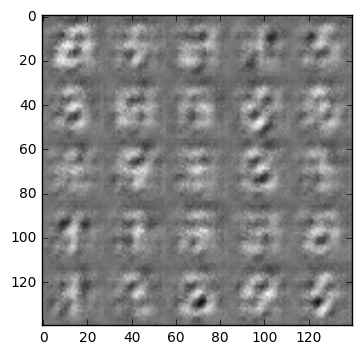

Epoch 1/2... Discriminator Loss: 1.4395... Generator Loss: 0.7632
Epoch 1/2... Discriminator Loss: 1.3632... Generator Loss: 0.8557
Epoch 1/2... Discriminator Loss: 1.3466... Generator Loss: 0.7689
Epoch 1/2... Discriminator Loss: 1.5888... Generator Loss: 0.6056
Epoch 1/2... Discriminator Loss: 1.3571... Generator Loss: 0.7593
Epoch 1/2... Discriminator Loss: 1.3003... Generator Loss: 1.1582
Epoch 1/2... Discriminator Loss: 1.2573... Generator Loss: 0.9178
Epoch 1/2... Discriminator Loss: 1.3964... Generator Loss: 1.4321
Epoch 1/2... Discriminator Loss: 1.2887... Generator Loss: 0.9498
Epoch 1/2... Discriminator Loss: 1.6353... Generator Loss: 0.5883


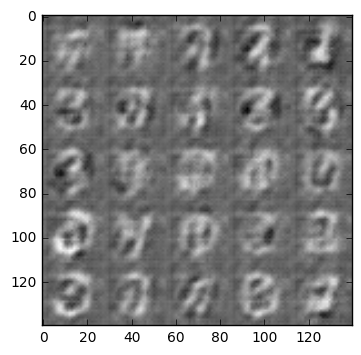

Epoch 1/2... Discriminator Loss: 1.3462... Generator Loss: 1.0668
Epoch 1/2... Discriminator Loss: 1.2289... Generator Loss: 1.0912
Epoch 1/2... Discriminator Loss: 1.2836... Generator Loss: 0.8178
Epoch 1/2... Discriminator Loss: 1.2201... Generator Loss: 1.3620
Epoch 1/2... Discriminator Loss: 1.2330... Generator Loss: 0.9557
Epoch 1/2... Discriminator Loss: 1.2893... Generator Loss: 0.8225
Epoch 1/2... Discriminator Loss: 1.3353... Generator Loss: 1.0236
Epoch 1/2... Discriminator Loss: 1.3063... Generator Loss: 0.8444
Epoch 1/2... Discriminator Loss: 1.3014... Generator Loss: 0.8313
Epoch 1/2... Discriminator Loss: 1.3677... Generator Loss: 0.8277


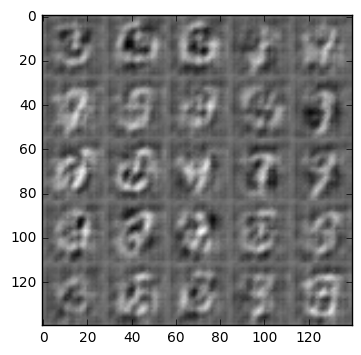

Epoch 1/2... Discriminator Loss: 1.5853... Generator Loss: 0.6233
Epoch 1/2... Discriminator Loss: 1.4366... Generator Loss: 0.7069
Epoch 1/2... Discriminator Loss: 1.8131... Generator Loss: 0.5693
Epoch 1/2... Discriminator Loss: 1.2303... Generator Loss: 1.2835
Epoch 1/2... Discriminator Loss: 1.3731... Generator Loss: 0.8363
Epoch 1/2... Discriminator Loss: 1.2998... Generator Loss: 0.9408
Epoch 1/2... Discriminator Loss: 1.4368... Generator Loss: 0.6933
Epoch 1/2... Discriminator Loss: 1.3457... Generator Loss: 0.9651
Epoch 1/2... Discriminator Loss: 1.3709... Generator Loss: 0.7342
Epoch 1/2... Discriminator Loss: 1.3557... Generator Loss: 0.7107


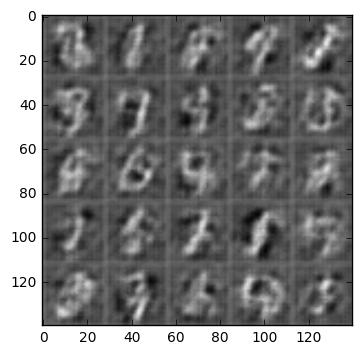

Epoch 1/2... Discriminator Loss: 1.3642... Generator Loss: 0.6693
Epoch 1/2... Discriminator Loss: 1.4079... Generator Loss: 0.8888
Epoch 1/2... Discriminator Loss: 1.4439... Generator Loss: 1.0120
Epoch 1/2... Discriminator Loss: 1.3190... Generator Loss: 0.8486
Epoch 1/2... Discriminator Loss: 1.3001... Generator Loss: 1.0479
Epoch 1/2... Discriminator Loss: 1.2790... Generator Loss: 1.1966
Epoch 1/2... Discriminator Loss: 1.3577... Generator Loss: 0.7332
Epoch 1/2... Discriminator Loss: 1.4451... Generator Loss: 0.6559
Epoch 1/2... Discriminator Loss: 1.4604... Generator Loss: 0.7427
Epoch 1/2... Discriminator Loss: 1.3851... Generator Loss: 0.9941


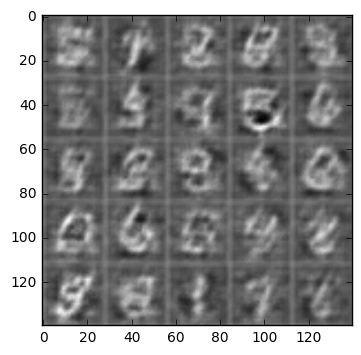

Epoch 1/2... Discriminator Loss: 1.3761... Generator Loss: 0.7862
Epoch 1/2... Discriminator Loss: 1.4366... Generator Loss: 0.6965
Epoch 1/2... Discriminator Loss: 1.3399... Generator Loss: 0.7893
Epoch 1/2... Discriminator Loss: 1.2713... Generator Loss: 1.1140
Epoch 1/2... Discriminator Loss: 1.4536... Generator Loss: 0.9165
Epoch 1/2... Discriminator Loss: 1.2484... Generator Loss: 0.9426
Epoch 1/2... Discriminator Loss: 1.4372... Generator Loss: 0.6831
Epoch 1/2... Discriminator Loss: 1.3237... Generator Loss: 1.1050
Epoch 1/2... Discriminator Loss: 1.2928... Generator Loss: 0.7953
Epoch 1/2... Discriminator Loss: 1.3522... Generator Loss: 0.7264


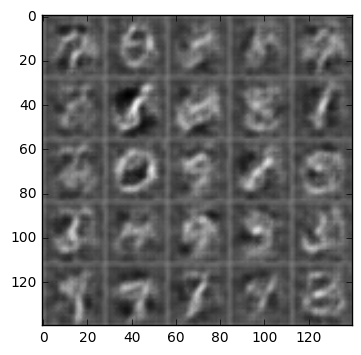

Epoch 1/2... Discriminator Loss: 1.3847... Generator Loss: 0.7683
Epoch 1/2... Discriminator Loss: 1.5598... Generator Loss: 0.7602
Epoch 1/2... Discriminator Loss: 1.4272... Generator Loss: 0.6939
Epoch 1/2... Discriminator Loss: 1.3519... Generator Loss: 0.9895
Epoch 1/2... Discriminator Loss: 1.2743... Generator Loss: 0.9042
Epoch 1/2... Discriminator Loss: 1.5996... Generator Loss: 0.6624
Epoch 1/2... Discriminator Loss: 1.5019... Generator Loss: 0.6915
Epoch 1/2... Discriminator Loss: 1.2308... Generator Loss: 1.1795
Epoch 1/2... Discriminator Loss: 1.3262... Generator Loss: 0.9562
Epoch 1/2... Discriminator Loss: 1.3886... Generator Loss: 0.9422


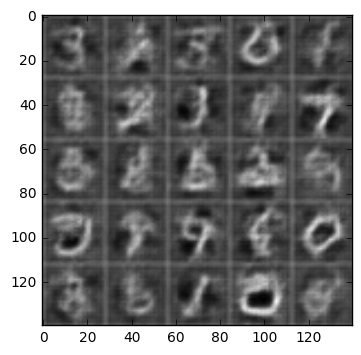

Epoch 1/2... Discriminator Loss: 1.5195... Generator Loss: 0.9288
Epoch 1/2... Discriminator Loss: 1.3681... Generator Loss: 0.7602
Epoch 1/2... Discriminator Loss: 1.2600... Generator Loss: 0.7893
Epoch 1/2... Discriminator Loss: 1.4854... Generator Loss: 0.7940
Epoch 1/2... Discriminator Loss: 1.2995... Generator Loss: 0.9870
Epoch 1/2... Discriminator Loss: 1.4312... Generator Loss: 0.7242
Epoch 1/2... Discriminator Loss: 1.3664... Generator Loss: 0.8410
Epoch 1/2... Discriminator Loss: 1.4658... Generator Loss: 0.7623
Epoch 1/2... Discriminator Loss: 1.2845... Generator Loss: 0.8052
Epoch 1/2... Discriminator Loss: 1.4243... Generator Loss: 0.6683


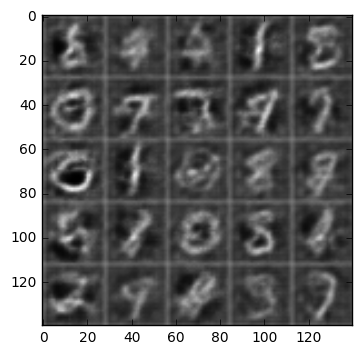

Epoch 1/2... Discriminator Loss: 1.3714... Generator Loss: 0.7593
Epoch 1/2... Discriminator Loss: 1.3305... Generator Loss: 0.8528
Epoch 1/2... Discriminator Loss: 1.3788... Generator Loss: 0.7486
Epoch 1/2... Discriminator Loss: 1.3759... Generator Loss: 0.9249
Epoch 1/2... Discriminator Loss: 1.3806... Generator Loss: 0.7376
Epoch 1/2... Discriminator Loss: 1.3950... Generator Loss: 0.6930
Epoch 1/2... Discriminator Loss: 1.3563... Generator Loss: 0.7866
Epoch 1/2... Discriminator Loss: 1.3528... Generator Loss: 0.7260
Epoch 1/2... Discriminator Loss: 1.3580... Generator Loss: 0.7042
Epoch 1/2... Discriminator Loss: 1.3582... Generator Loss: 0.8635


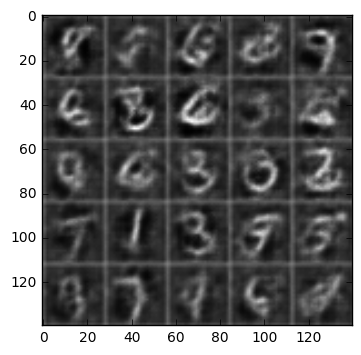

Epoch 1/2... Discriminator Loss: 1.4676... Generator Loss: 0.7651
Epoch 1/2... Discriminator Loss: 1.6222... Generator Loss: 0.5834
Epoch 1/2... Discriminator Loss: 1.2960... Generator Loss: 0.8821
Epoch 1/2... Discriminator Loss: 1.4151... Generator Loss: 0.7379
Epoch 1/2... Discriminator Loss: 1.4729... Generator Loss: 0.8516
Epoch 1/2... Discriminator Loss: 1.4193... Generator Loss: 0.6712
Epoch 1/2... Discriminator Loss: 1.3932... Generator Loss: 0.7959
Epoch 1/2... Discriminator Loss: 1.2449... Generator Loss: 1.0400
Epoch 1/2... Discriminator Loss: 1.2967... Generator Loss: 1.1150
Epoch 1/2... Discriminator Loss: 1.4611... Generator Loss: 0.7179


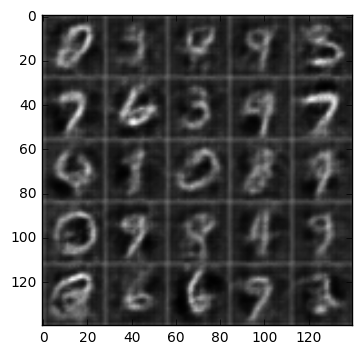

Epoch 1/2... Discriminator Loss: 1.3757... Generator Loss: 0.7477
Epoch 1/2... Discriminator Loss: 1.6677... Generator Loss: 0.5791
Epoch 1/2... Discriminator Loss: 1.3042... Generator Loss: 0.7772
Epoch 1/2... Discriminator Loss: 1.3879... Generator Loss: 0.7763
Epoch 1/2... Discriminator Loss: 1.6494... Generator Loss: 0.5811
Epoch 1/2... Discriminator Loss: 1.2857... Generator Loss: 1.1268
Epoch 1/2... Discriminator Loss: 1.4283... Generator Loss: 0.7033
Epoch 1/2... Discriminator Loss: 1.4177... Generator Loss: 0.7472
Epoch 1/2... Discriminator Loss: 1.8773... Generator Loss: 0.6186
Epoch 1/2... Discriminator Loss: 1.5434... Generator Loss: 0.6198


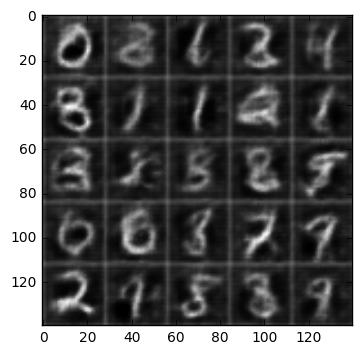

Epoch 1/2... Discriminator Loss: 1.5415... Generator Loss: 0.6245
Epoch 1/2... Discriminator Loss: 1.3656... Generator Loss: 0.6917
Epoch 1/2... Discriminator Loss: 1.3585... Generator Loss: 0.7124
Epoch 1/2... Discriminator Loss: 1.2265... Generator Loss: 1.1166
Epoch 1/2... Discriminator Loss: 1.3869... Generator Loss: 0.7289
Epoch 1/2... Discriminator Loss: 1.4878... Generator Loss: 0.6387
Epoch 1/2... Discriminator Loss: 1.3582... Generator Loss: 0.7222
Epoch 1/2... Discriminator Loss: 1.4241... Generator Loss: 0.6401
Epoch 1/2... Discriminator Loss: 1.2203... Generator Loss: 0.8988
Epoch 1/2... Discriminator Loss: 1.5780... Generator Loss: 0.6520


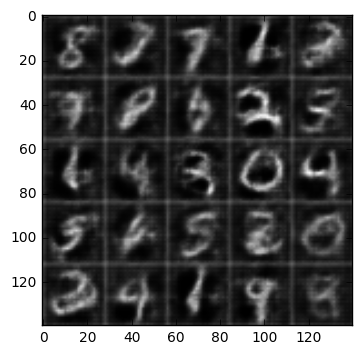

Epoch 1/2... Discriminator Loss: 1.3291... Generator Loss: 0.7200
Epoch 1/2... Discriminator Loss: 1.4429... Generator Loss: 0.7402
Epoch 1/2... Discriminator Loss: 1.3210... Generator Loss: 0.8323
Epoch 1/2... Discriminator Loss: 1.3425... Generator Loss: 0.7916
Epoch 1/2... Discriminator Loss: 1.4378... Generator Loss: 0.7317
Epoch 1/2... Discriminator Loss: 1.2748... Generator Loss: 0.9464
Epoch 1/2... Discriminator Loss: 1.5005... Generator Loss: 0.6343
Epoch 1/2... Discriminator Loss: 1.4197... Generator Loss: 0.6653
Epoch 1/2... Discriminator Loss: 1.3501... Generator Loss: 0.6987
Epoch 1/2... Discriminator Loss: 1.5517... Generator Loss: 0.6640


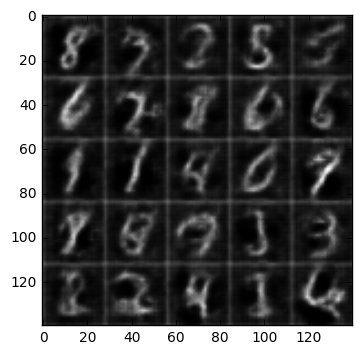

Epoch 1/2... Discriminator Loss: 1.4721... Generator Loss: 0.6449
Epoch 1/2... Discriminator Loss: 1.4309... Generator Loss: 0.6879
Epoch 1/2... Discriminator Loss: 1.3836... Generator Loss: 0.8213
Epoch 1/2... Discriminator Loss: 1.3293... Generator Loss: 0.8650
Epoch 1/2... Discriminator Loss: 1.6449... Generator Loss: 0.6090
Epoch 1/2... Discriminator Loss: 1.4851... Generator Loss: 0.6291
Epoch 1/2... Discriminator Loss: 1.3824... Generator Loss: 0.7839
Epoch 1/2... Discriminator Loss: 1.2753... Generator Loss: 0.8616
Epoch 1/2... Discriminator Loss: 1.5945... Generator Loss: 0.5998
Epoch 1/2... Discriminator Loss: 1.9739... Generator Loss: 0.5715


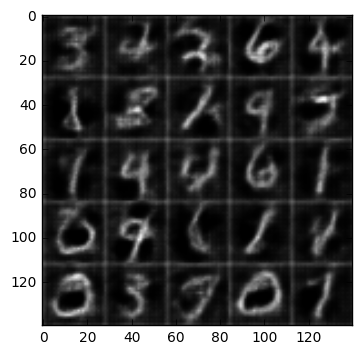

Epoch 1/2... Discriminator Loss: 1.4190... Generator Loss: 0.8080
Epoch 1/2... Discriminator Loss: 1.4364... Generator Loss: 0.6605
Epoch 1/2... Discriminator Loss: 1.5562... Generator Loss: 0.6232
Epoch 1/2... Discriminator Loss: 1.3692... Generator Loss: 0.7125
Epoch 1/2... Discriminator Loss: 1.5463... Generator Loss: 0.6240
Epoch 1/2... Discriminator Loss: 1.6990... Generator Loss: 0.6249
Epoch 1/2... Discriminator Loss: 1.3637... Generator Loss: 0.7718
Epoch 1/2... Discriminator Loss: 1.5161... Generator Loss: 0.6106
Epoch 1/2... Discriminator Loss: 1.4655... Generator Loss: 0.6312
Epoch 1/2... Discriminator Loss: 1.7359... Generator Loss: 0.5838


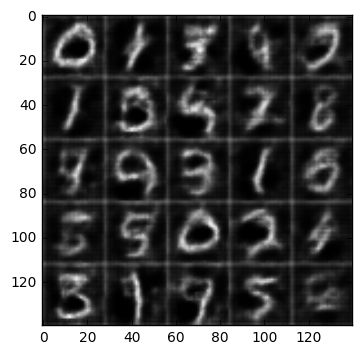

Epoch 1/2... Discriminator Loss: 1.5870... Generator Loss: 0.6172
Epoch 1/2... Discriminator Loss: 1.3922... Generator Loss: 0.7824
Epoch 1/2... Discriminator Loss: 1.4594... Generator Loss: 0.7101
Epoch 1/2... Discriminator Loss: 1.5022... Generator Loss: 0.7235
Epoch 1/2... Discriminator Loss: 1.3961... Generator Loss: 0.7423
Epoch 1/2... Discriminator Loss: 1.4447... Generator Loss: 0.6728
Epoch 1/2... Discriminator Loss: 1.6174... Generator Loss: 0.5781
Epoch 1/2... Discriminator Loss: 1.6002... Generator Loss: 0.5674
Epoch 1/2... Discriminator Loss: 1.4691... Generator Loss: 0.6653
Epoch 1/2... Discriminator Loss: 1.6955... Generator Loss: 0.5030


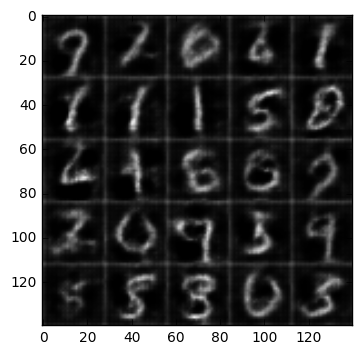

Epoch 1/2... Discriminator Loss: 1.3180... Generator Loss: 0.8328
Epoch 1/2... Discriminator Loss: 1.6400... Generator Loss: 0.5676
Epoch 1/2... Discriminator Loss: 1.6410... Generator Loss: 0.5899
Epoch 1/2... Discriminator Loss: 1.5559... Generator Loss: 0.7466
Epoch 1/2... Discriminator Loss: 1.4449... Generator Loss: 0.7189
Epoch 1/2... Discriminator Loss: 1.4667... Generator Loss: 0.6771
Epoch 1/2... Discriminator Loss: 1.3571... Generator Loss: 0.6636
Epoch 1/2... Discriminator Loss: 1.6662... Generator Loss: 0.5764
Epoch 1/2... Discriminator Loss: 1.5745... Generator Loss: 0.6448
Epoch 1/2... Discriminator Loss: 1.6046... Generator Loss: 0.5897


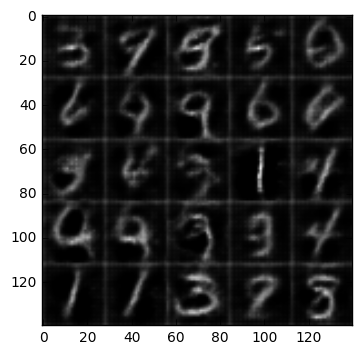

Epoch 1/2... Discriminator Loss: 1.3400... Generator Loss: 1.0296
Epoch 1/2... Discriminator Loss: 1.7149... Generator Loss: 0.6413
Epoch 1/2... Discriminator Loss: 1.4693... Generator Loss: 0.7885
Epoch 1/2... Discriminator Loss: 1.4748... Generator Loss: 0.6589
Epoch 1/2... Discriminator Loss: 1.4432... Generator Loss: 0.6403
Epoch 1/2... Discriminator Loss: 1.3434... Generator Loss: 0.7298
Epoch 1/2... Discriminator Loss: 1.2561... Generator Loss: 0.9256
Epoch 1/2... Discriminator Loss: 1.3981... Generator Loss: 0.7714
Epoch 1/2... Discriminator Loss: 1.5432... Generator Loss: 0.7610
Epoch 1/2... Discriminator Loss: 1.3500... Generator Loss: 0.7503


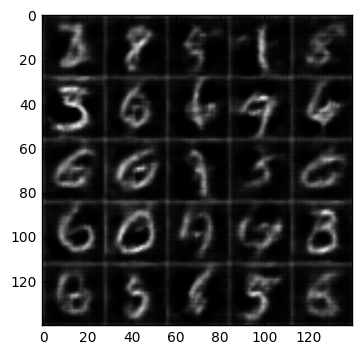

Epoch 1/2... Discriminator Loss: 1.5888... Generator Loss: 0.6430
Epoch 1/2... Discriminator Loss: 1.5424... Generator Loss: 0.6687
Epoch 1/2... Discriminator Loss: 1.3838... Generator Loss: 0.6829
Epoch 1/2... Discriminator Loss: 1.4525... Generator Loss: 0.6378
Epoch 1/2... Discriminator Loss: 1.4427... Generator Loss: 0.6956
Epoch 1/2... Discriminator Loss: 1.4217... Generator Loss: 1.0662
Epoch 1/2... Discriminator Loss: 1.4724... Generator Loss: 0.7250
Epoch 1/2... Discriminator Loss: 1.3426... Generator Loss: 0.8241
Epoch 2/2... Discriminator Loss: 1.6861... Generator Loss: 0.5720
Epoch 2/2... Discriminator Loss: 1.2088... Generator Loss: 0.9557
Epoch 2/2... Discriminator Loss: 1.5235... Generator Loss: 0.6160
Epoch 2/2... Discriminator Loss: 1.2746... Generator Loss: 0.9949
Epoch 2/2... Discriminator Loss: 1.3667... Generator Loss: 0.7505
Epoch 2/2... Discriminator Loss: 1.4633... Generator Loss: 0.7126
Epoch 2/2... Discriminator Loss: 1.4920... Generator Loss: 0.8103
Epoch 2/2.

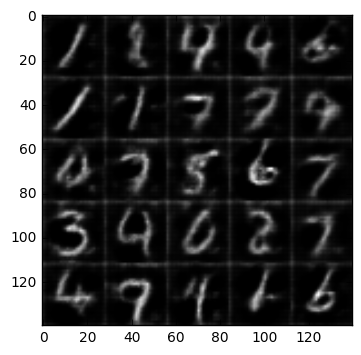

Epoch 2/2... Discriminator Loss: 1.3758... Generator Loss: 0.7715
Epoch 2/2... Discriminator Loss: 1.3054... Generator Loss: 0.8224
Epoch 2/2... Discriminator Loss: 1.6574... Generator Loss: 0.5515
Epoch 2/2... Discriminator Loss: 1.4875... Generator Loss: 0.6691
Epoch 2/2... Discriminator Loss: 1.3256... Generator Loss: 0.7706
Epoch 2/2... Discriminator Loss: 1.4821... Generator Loss: 0.6752
Epoch 2/2... Discriminator Loss: 1.7406... Generator Loss: 0.5690
Epoch 2/2... Discriminator Loss: 1.3714... Generator Loss: 0.8751
Epoch 2/2... Discriminator Loss: 1.6597... Generator Loss: 0.5614
Epoch 2/2... Discriminator Loss: 1.4582... Generator Loss: 0.6745


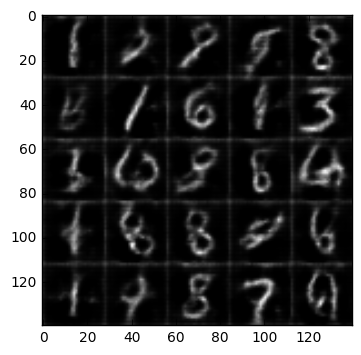

Epoch 2/2... Discriminator Loss: 1.4013... Generator Loss: 0.7062
Epoch 2/2... Discriminator Loss: 1.3485... Generator Loss: 0.8178
Epoch 2/2... Discriminator Loss: 1.5127... Generator Loss: 0.6736
Epoch 2/2... Discriminator Loss: 1.4727... Generator Loss: 0.6207
Epoch 2/2... Discriminator Loss: 1.4028... Generator Loss: 0.8175
Epoch 2/2... Discriminator Loss: 1.3489... Generator Loss: 1.0822
Epoch 2/2... Discriminator Loss: 1.3949... Generator Loss: 0.7351
Epoch 2/2... Discriminator Loss: 1.5222... Generator Loss: 0.6640
Epoch 2/2... Discriminator Loss: 1.4720... Generator Loss: 0.9319
Epoch 2/2... Discriminator Loss: 1.4049... Generator Loss: 0.8876


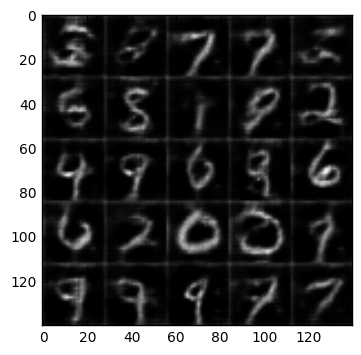

Epoch 2/2... Discriminator Loss: 1.4903... Generator Loss: 0.6139
Epoch 2/2... Discriminator Loss: 1.4503... Generator Loss: 0.6545
Epoch 2/2... Discriminator Loss: 1.4503... Generator Loss: 0.6375
Epoch 2/2... Discriminator Loss: 1.3228... Generator Loss: 0.7438
Epoch 2/2... Discriminator Loss: 1.3107... Generator Loss: 0.8742
Epoch 2/2... Discriminator Loss: 1.3069... Generator Loss: 0.7819
Epoch 2/2... Discriminator Loss: 1.5767... Generator Loss: 0.5870
Epoch 2/2... Discriminator Loss: 1.6645... Generator Loss: 0.6027
Epoch 2/2... Discriminator Loss: 1.3312... Generator Loss: 0.7586
Epoch 2/2... Discriminator Loss: 1.5640... Generator Loss: 0.5557


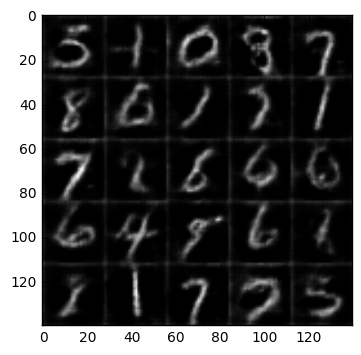

Epoch 2/2... Discriminator Loss: 1.5286... Generator Loss: 0.6018
Epoch 2/2... Discriminator Loss: 1.5295... Generator Loss: 0.6009
Epoch 2/2... Discriminator Loss: 1.4557... Generator Loss: 0.7157
Epoch 2/2... Discriminator Loss: 1.6077... Generator Loss: 0.6248
Epoch 2/2... Discriminator Loss: 1.5788... Generator Loss: 0.6202
Epoch 2/2... Discriminator Loss: 1.4419... Generator Loss: 0.6367
Epoch 2/2... Discriminator Loss: 1.5275... Generator Loss: 0.6330
Epoch 2/2... Discriminator Loss: 1.3845... Generator Loss: 0.7774
Epoch 2/2... Discriminator Loss: 1.5334... Generator Loss: 0.6155
Epoch 2/2... Discriminator Loss: 1.4414... Generator Loss: 0.7118


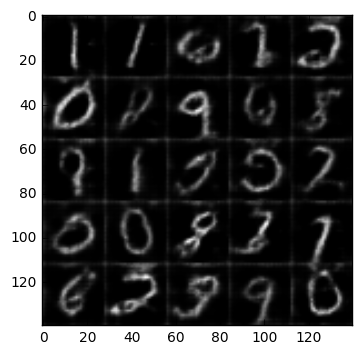

Epoch 2/2... Discriminator Loss: 1.4091... Generator Loss: 0.9552
Epoch 2/2... Discriminator Loss: 1.8202... Generator Loss: 0.5674
Epoch 2/2... Discriminator Loss: 1.3835... Generator Loss: 0.6756
Epoch 2/2... Discriminator Loss: 1.3114... Generator Loss: 0.8009
Epoch 2/2... Discriminator Loss: 1.8616... Generator Loss: 0.5737
Epoch 2/2... Discriminator Loss: 1.4192... Generator Loss: 0.7180
Epoch 2/2... Discriminator Loss: 1.3792... Generator Loss: 0.7909
Epoch 2/2... Discriminator Loss: 1.5533... Generator Loss: 0.5826
Epoch 2/2... Discriminator Loss: 1.3975... Generator Loss: 0.6808
Epoch 2/2... Discriminator Loss: 1.6953... Generator Loss: 0.6129


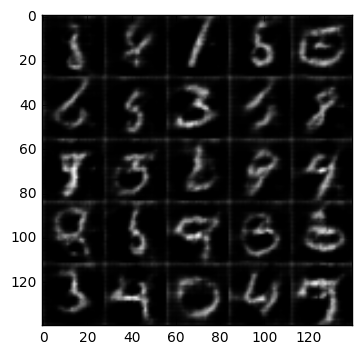

Epoch 2/2... Discriminator Loss: 1.6060... Generator Loss: 0.6206
Epoch 2/2... Discriminator Loss: 1.3570... Generator Loss: 0.7128
Epoch 2/2... Discriminator Loss: 1.4914... Generator Loss: 0.6448
Epoch 2/2... Discriminator Loss: 1.2890... Generator Loss: 0.7767
Epoch 2/2... Discriminator Loss: 1.4178... Generator Loss: 0.7466
Epoch 2/2... Discriminator Loss: 1.4094... Generator Loss: 0.7266
Epoch 2/2... Discriminator Loss: 1.3183... Generator Loss: 0.7794
Epoch 2/2... Discriminator Loss: 1.5672... Generator Loss: 0.5577
Epoch 2/2... Discriminator Loss: 1.5669... Generator Loss: 0.6139
Epoch 2/2... Discriminator Loss: 1.4822... Generator Loss: 0.7492


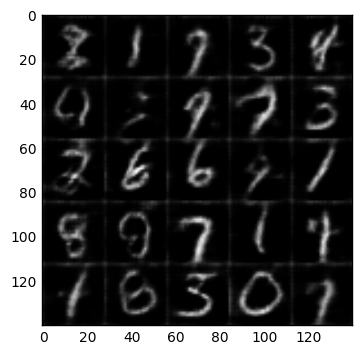

Epoch 2/2... Discriminator Loss: 1.3589... Generator Loss: 0.7474
Epoch 2/2... Discriminator Loss: 1.4938... Generator Loss: 0.6613
Epoch 2/2... Discriminator Loss: 1.4096... Generator Loss: 0.6576
Epoch 2/2... Discriminator Loss: 1.2904... Generator Loss: 0.7416
Epoch 2/2... Discriminator Loss: 1.2840... Generator Loss: 0.7601
Epoch 2/2... Discriminator Loss: 1.5355... Generator Loss: 0.6385
Epoch 2/2... Discriminator Loss: 1.3637... Generator Loss: 0.8527
Epoch 2/2... Discriminator Loss: 1.2063... Generator Loss: 0.8318
Epoch 2/2... Discriminator Loss: 1.4080... Generator Loss: 0.6952
Epoch 2/2... Discriminator Loss: 1.6105... Generator Loss: 0.6171


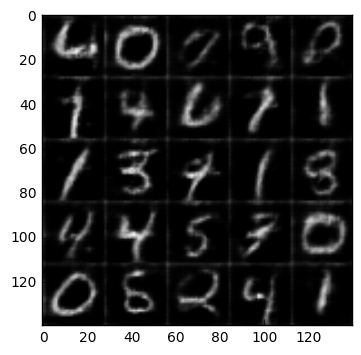

Epoch 2/2... Discriminator Loss: 1.4835... Generator Loss: 0.6969
Epoch 2/2... Discriminator Loss: 1.3248... Generator Loss: 0.7744
Epoch 2/2... Discriminator Loss: 1.3385... Generator Loss: 0.8287
Epoch 2/2... Discriminator Loss: 1.5237... Generator Loss: 0.6472
Epoch 2/2... Discriminator Loss: 1.5670... Generator Loss: 0.6615
Epoch 2/2... Discriminator Loss: 1.3505... Generator Loss: 0.6933
Epoch 2/2... Discriminator Loss: 1.5736... Generator Loss: 0.6289
Epoch 2/2... Discriminator Loss: 1.4557... Generator Loss: 0.6705
Epoch 2/2... Discriminator Loss: 1.6868... Generator Loss: 0.5878
Epoch 2/2... Discriminator Loss: 1.5065... Generator Loss: 0.6061


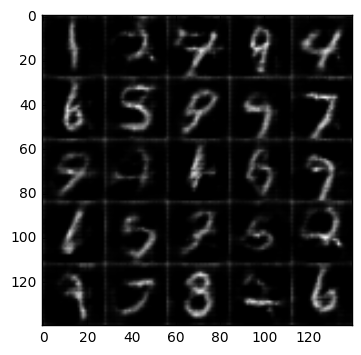

Epoch 2/2... Discriminator Loss: 1.5969... Generator Loss: 0.6435
Epoch 2/2... Discriminator Loss: 1.5255... Generator Loss: 0.6131
Epoch 2/2... Discriminator Loss: 1.3686... Generator Loss: 0.7648
Epoch 2/2... Discriminator Loss: 1.8479... Generator Loss: 1.6228
Epoch 2/2... Discriminator Loss: 1.6600... Generator Loss: 0.6535
Epoch 2/2... Discriminator Loss: 1.7838... Generator Loss: 0.5684
Epoch 2/2... Discriminator Loss: 1.4766... Generator Loss: 0.6441
Epoch 2/2... Discriminator Loss: 1.7746... Generator Loss: 0.5349
Epoch 2/2... Discriminator Loss: 1.6163... Generator Loss: 0.6387
Epoch 2/2... Discriminator Loss: 1.4960... Generator Loss: 0.6861


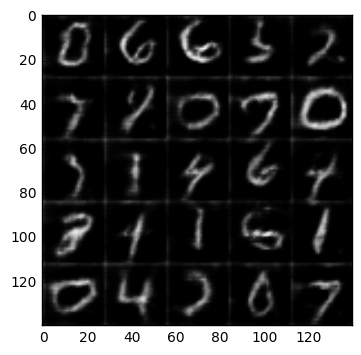

Epoch 2/2... Discriminator Loss: 1.3637... Generator Loss: 0.7699
Epoch 2/2... Discriminator Loss: 1.4389... Generator Loss: 0.6099
Epoch 2/2... Discriminator Loss: 1.5896... Generator Loss: 0.6303
Epoch 2/2... Discriminator Loss: 1.2587... Generator Loss: 1.0097
Epoch 2/2... Discriminator Loss: 1.3518... Generator Loss: 0.7624
Epoch 2/2... Discriminator Loss: 1.2810... Generator Loss: 0.9660
Epoch 2/2... Discriminator Loss: 1.5266... Generator Loss: 0.6535
Epoch 2/2... Discriminator Loss: 1.6227... Generator Loss: 0.6015
Epoch 2/2... Discriminator Loss: 1.3756... Generator Loss: 0.7100
Epoch 2/2... Discriminator Loss: 1.3954... Generator Loss: 0.8041


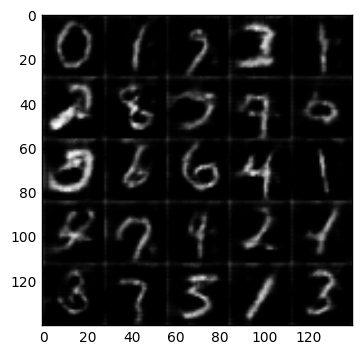

Epoch 2/2... Discriminator Loss: 1.5783... Generator Loss: 0.6022
Epoch 2/2... Discriminator Loss: 1.6265... Generator Loss: 0.6168
Epoch 2/2... Discriminator Loss: 1.4240... Generator Loss: 0.6630
Epoch 2/2... Discriminator Loss: 1.3757... Generator Loss: 0.9545
Epoch 2/2... Discriminator Loss: 1.2569... Generator Loss: 0.8658
Epoch 2/2... Discriminator Loss: 1.6610... Generator Loss: 0.5401
Epoch 2/2... Discriminator Loss: 1.2742... Generator Loss: 0.9071
Epoch 2/2... Discriminator Loss: 1.4913... Generator Loss: 0.6160
Epoch 2/2... Discriminator Loss: 1.3410... Generator Loss: 0.7563
Epoch 2/2... Discriminator Loss: 1.8903... Generator Loss: 0.6048


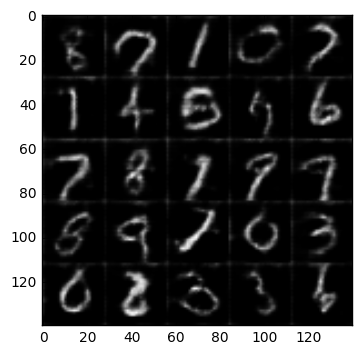

Epoch 2/2... Discriminator Loss: 1.3601... Generator Loss: 0.7191
Epoch 2/2... Discriminator Loss: 1.3433... Generator Loss: 0.8357
Epoch 2/2... Discriminator Loss: 1.2787... Generator Loss: 0.8225
Epoch 2/2... Discriminator Loss: 1.4395... Generator Loss: 0.8049
Epoch 2/2... Discriminator Loss: 1.2517... Generator Loss: 0.8531
Epoch 2/2... Discriminator Loss: 1.3931... Generator Loss: 0.7688
Epoch 2/2... Discriminator Loss: 1.4607... Generator Loss: 0.6498
Epoch 2/2... Discriminator Loss: 1.3236... Generator Loss: 0.8475
Epoch 2/2... Discriminator Loss: 1.2454... Generator Loss: 0.9013
Epoch 2/2... Discriminator Loss: 1.3631... Generator Loss: 0.7132


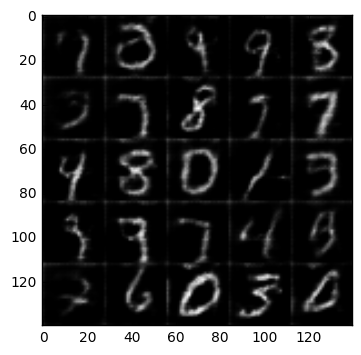

Epoch 2/2... Discriminator Loss: 1.4666... Generator Loss: 0.6551
Epoch 2/2... Discriminator Loss: 1.4697... Generator Loss: 0.6618
Epoch 2/2... Discriminator Loss: 1.2661... Generator Loss: 0.8846
Epoch 2/2... Discriminator Loss: 1.3915... Generator Loss: 0.6738
Epoch 2/2... Discriminator Loss: 1.3151... Generator Loss: 0.7627
Epoch 2/2... Discriminator Loss: 1.3125... Generator Loss: 0.7847
Epoch 2/2... Discriminator Loss: 1.9100... Generator Loss: 0.4992
Epoch 2/2... Discriminator Loss: 1.4015... Generator Loss: 0.7206
Epoch 2/2... Discriminator Loss: 1.5201... Generator Loss: 0.6903
Epoch 2/2... Discriminator Loss: 1.3719... Generator Loss: 0.7034


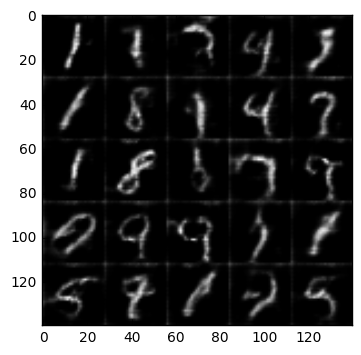

Epoch 2/2... Discriminator Loss: 1.3469... Generator Loss: 0.7114
Epoch 2/2... Discriminator Loss: 1.5166... Generator Loss: 0.6418
Epoch 2/2... Discriminator Loss: 1.4290... Generator Loss: 0.6799
Epoch 2/2... Discriminator Loss: 1.2428... Generator Loss: 0.9378
Epoch 2/2... Discriminator Loss: 1.4386... Generator Loss: 0.7055
Epoch 2/2... Discriminator Loss: 1.5447... Generator Loss: 0.6123
Epoch 2/2... Discriminator Loss: 1.4188... Generator Loss: 0.6938
Epoch 2/2... Discriminator Loss: 1.9224... Generator Loss: 0.5913
Epoch 2/2... Discriminator Loss: 1.4037... Generator Loss: 0.6746
Epoch 2/2... Discriminator Loss: 1.9260... Generator Loss: 0.5147


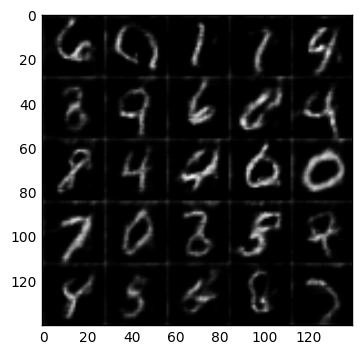

Epoch 2/2... Discriminator Loss: 1.5135... Generator Loss: 0.6944
Epoch 2/2... Discriminator Loss: 1.3926... Generator Loss: 0.7138
Epoch 2/2... Discriminator Loss: 1.4117... Generator Loss: 0.8135
Epoch 2/2... Discriminator Loss: 1.4478... Generator Loss: 0.6863
Epoch 2/2... Discriminator Loss: 1.4712... Generator Loss: 0.6282
Epoch 2/2... Discriminator Loss: 1.2777... Generator Loss: 0.9208
Epoch 2/2... Discriminator Loss: 1.4196... Generator Loss: 0.7101
Epoch 2/2... Discriminator Loss: 1.2835... Generator Loss: 0.8767
Epoch 2/2... Discriminator Loss: 1.5992... Generator Loss: 0.5976
Epoch 2/2... Discriminator Loss: 1.5051... Generator Loss: 0.6459


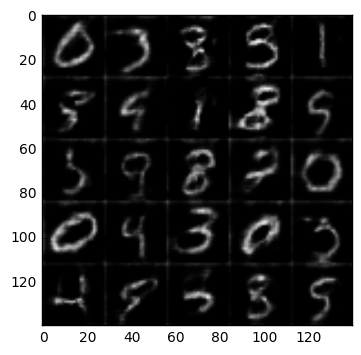

Epoch 2/2... Discriminator Loss: 1.6811... Generator Loss: 0.5810
Epoch 2/2... Discriminator Loss: 1.4680... Generator Loss: 0.6325
Epoch 2/2... Discriminator Loss: 1.4903... Generator Loss: 0.6211
Epoch 2/2... Discriminator Loss: 1.4904... Generator Loss: 0.7468
Epoch 2/2... Discriminator Loss: 1.6390... Generator Loss: 0.5950
Epoch 2/2... Discriminator Loss: 1.4698... Generator Loss: 0.6618
Epoch 2/2... Discriminator Loss: 1.4183... Generator Loss: 0.7528
Epoch 2/2... Discriminator Loss: 1.6416... Generator Loss: 0.5794
Epoch 2/2... Discriminator Loss: 1.8027... Generator Loss: 0.6319
Epoch 2/2... Discriminator Loss: 1.3391... Generator Loss: 0.7682


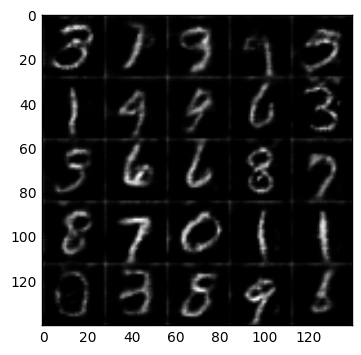

Epoch 2/2... Discriminator Loss: 1.4802... Generator Loss: 0.5873
Epoch 2/2... Discriminator Loss: 1.5186... Generator Loss: 0.5894
Epoch 2/2... Discriminator Loss: 1.3601... Generator Loss: 0.8155
Epoch 2/2... Discriminator Loss: 1.4927... Generator Loss: 0.6352
Epoch 2/2... Discriminator Loss: 1.2518... Generator Loss: 1.0083
Epoch 2/2... Discriminator Loss: 1.3722... Generator Loss: 0.7732
Epoch 2/2... Discriminator Loss: 1.4906... Generator Loss: 0.6718
Epoch 2/2... Discriminator Loss: 1.3472... Generator Loss: 0.7910
Epoch 2/2... Discriminator Loss: 1.5814... Generator Loss: 0.5890
Epoch 2/2... Discriminator Loss: 1.5830... Generator Loss: 0.5908


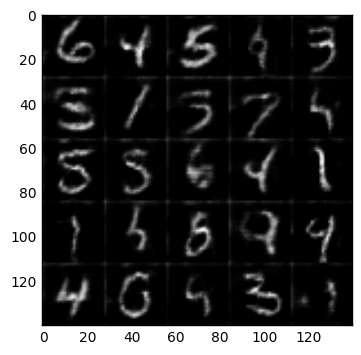

Epoch 2/2... Discriminator Loss: 1.4682... Generator Loss: 0.6344
Epoch 2/2... Discriminator Loss: 1.3785... Generator Loss: 0.7635
Epoch 2/2... Discriminator Loss: 1.5467... Generator Loss: 0.6383
Epoch 2/2... Discriminator Loss: 1.6289... Generator Loss: 0.6086
Epoch 2/2... Discriminator Loss: 1.3099... Generator Loss: 0.7397
Epoch 2/2... Discriminator Loss: 1.4789... Generator Loss: 0.6500
Epoch 2/2... Discriminator Loss: 1.4594... Generator Loss: 0.6520
Epoch 2/2... Discriminator Loss: 1.3956... Generator Loss: 0.6523


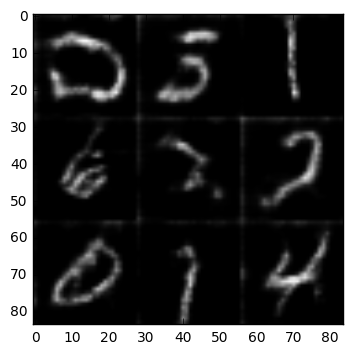

In [12]:
batch_size = 32
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

(202599, 28, 28, 3)
Epoch 1/1... Discriminator Loss: 1.8269... Generator Loss: 0.6572
Epoch 1/1... Discriminator Loss: 1.1866... Generator Loss: 1.8830
Epoch 1/1... Discriminator Loss: 1.1700... Generator Loss: 0.7353
Epoch 1/1... Discriminator Loss: 1.0733... Generator Loss: 0.8104
Epoch 1/1... Discriminator Loss: 1.4623... Generator Loss: 0.6313
Epoch 1/1... Discriminator Loss: 1.3521... Generator Loss: 0.6889
Epoch 1/1... Discriminator Loss: 1.2950... Generator Loss: 0.8661
Epoch 1/1... Discriminator Loss: 1.4154... Generator Loss: 0.6515
Epoch 1/1... Discriminator Loss: 1.2831... Generator Loss: 0.9761


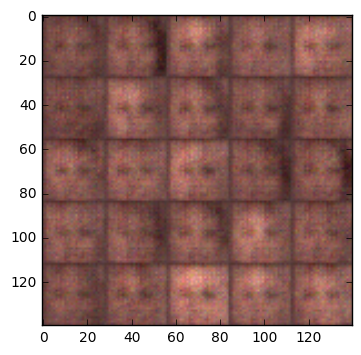

Epoch 1/1... Discriminator Loss: 1.3928... Generator Loss: 0.6546
Epoch 1/1... Discriminator Loss: 1.3886... Generator Loss: 0.6876
Epoch 1/1... Discriminator Loss: 1.4062... Generator Loss: 1.2469
Epoch 1/1... Discriminator Loss: 1.4437... Generator Loss: 0.6895
Epoch 1/1... Discriminator Loss: 1.3949... Generator Loss: 0.7981
Epoch 1/1... Discriminator Loss: 1.3670... Generator Loss: 0.6450
Epoch 1/1... Discriminator Loss: 1.3326... Generator Loss: 0.6620
Epoch 1/1... Discriminator Loss: 1.4880... Generator Loss: 0.6721
Epoch 1/1... Discriminator Loss: 1.2884... Generator Loss: 0.7309
Epoch 1/1... Discriminator Loss: 1.2873... Generator Loss: 1.0185


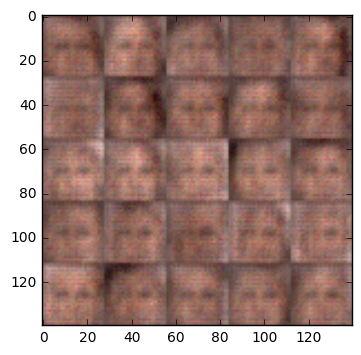

Epoch 1/1... Discriminator Loss: 1.3009... Generator Loss: 0.6295
Epoch 1/1... Discriminator Loss: 1.4571... Generator Loss: 1.1985
Epoch 1/1... Discriminator Loss: 1.3928... Generator Loss: 0.9398
Epoch 1/1... Discriminator Loss: 1.6045... Generator Loss: 0.8418
Epoch 1/1... Discriminator Loss: 1.1766... Generator Loss: 0.7079
Epoch 1/1... Discriminator Loss: 1.2957... Generator Loss: 0.6371
Epoch 1/1... Discriminator Loss: 1.1881... Generator Loss: 0.7134
Epoch 1/1... Discriminator Loss: 1.4008... Generator Loss: 0.6484
Epoch 1/1... Discriminator Loss: 1.5611... Generator Loss: 0.6832
Epoch 1/1... Discriminator Loss: 1.3026... Generator Loss: 0.6551


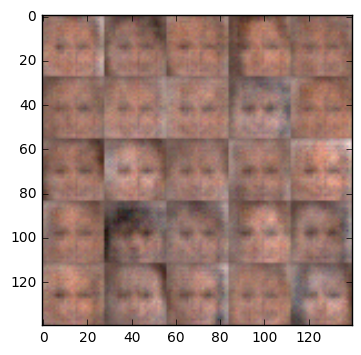

Epoch 1/1... Discriminator Loss: 1.3737... Generator Loss: 0.6522
Epoch 1/1... Discriminator Loss: 1.2904... Generator Loss: 0.9043
Epoch 1/1... Discriminator Loss: 1.3464... Generator Loss: 0.8107
Epoch 1/1... Discriminator Loss: 1.3638... Generator Loss: 0.6360
Epoch 1/1... Discriminator Loss: 1.4759... Generator Loss: 0.7201
Epoch 1/1... Discriminator Loss: 1.4289... Generator Loss: 0.6431
Epoch 1/1... Discriminator Loss: 1.3708... Generator Loss: 0.6416
Epoch 1/1... Discriminator Loss: 1.3611... Generator Loss: 0.6137
Epoch 1/1... Discriminator Loss: 1.5133... Generator Loss: 0.6409
Epoch 1/1... Discriminator Loss: 1.6904... Generator Loss: 0.7138


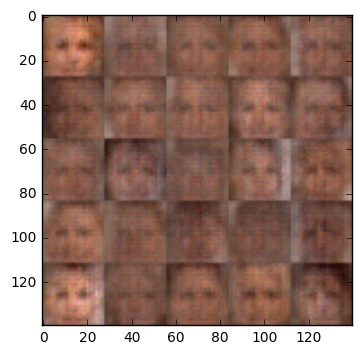

Epoch 1/1... Discriminator Loss: 1.5929... Generator Loss: 0.6166
Epoch 1/1... Discriminator Loss: 1.5546... Generator Loss: 0.6426
Epoch 1/1... Discriminator Loss: 1.4717... Generator Loss: 0.6504
Epoch 1/1... Discriminator Loss: 1.4527... Generator Loss: 0.6374
Epoch 1/1... Discriminator Loss: 1.3042... Generator Loss: 0.6927
Epoch 1/1... Discriminator Loss: 1.3719... Generator Loss: 0.6363
Epoch 1/1... Discriminator Loss: 1.3362... Generator Loss: 0.6862
Epoch 1/1... Discriminator Loss: 1.3678... Generator Loss: 0.6664
Epoch 1/1... Discriminator Loss: 1.3378... Generator Loss: 0.7582
Epoch 1/1... Discriminator Loss: 1.4219... Generator Loss: 0.6910


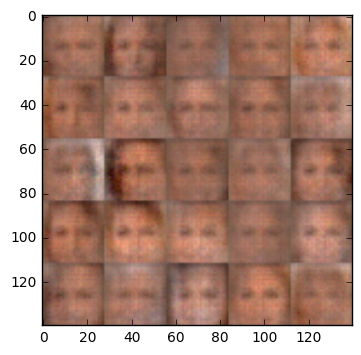

Epoch 1/1... Discriminator Loss: 1.4502... Generator Loss: 0.6610
Epoch 1/1... Discriminator Loss: 1.6756... Generator Loss: 0.7123
Epoch 1/1... Discriminator Loss: 1.3004... Generator Loss: 0.7186
Epoch 1/1... Discriminator Loss: 1.5471... Generator Loss: 0.6340
Epoch 1/1... Discriminator Loss: 1.2773... Generator Loss: 0.6760
Epoch 1/1... Discriminator Loss: 1.4321... Generator Loss: 0.6667
Epoch 1/1... Discriminator Loss: 1.3696... Generator Loss: 0.7016
Epoch 1/1... Discriminator Loss: 1.3924... Generator Loss: 0.6324
Epoch 1/1... Discriminator Loss: 1.5159... Generator Loss: 0.7522
Epoch 1/1... Discriminator Loss: 1.4319... Generator Loss: 0.7181


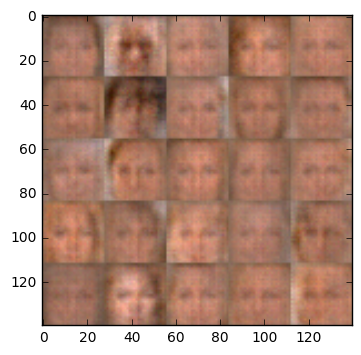

Epoch 1/1... Discriminator Loss: 1.4864... Generator Loss: 0.6560
Epoch 1/1... Discriminator Loss: 1.3075... Generator Loss: 0.7370
Epoch 1/1... Discriminator Loss: 1.3638... Generator Loss: 0.7447
Epoch 1/1... Discriminator Loss: 1.3149... Generator Loss: 0.7187
Epoch 1/1... Discriminator Loss: 1.4321... Generator Loss: 0.6880
Epoch 1/1... Discriminator Loss: 1.3172... Generator Loss: 0.7264
Epoch 1/1... Discriminator Loss: 1.3591... Generator Loss: 0.7159
Epoch 1/1... Discriminator Loss: 1.2215... Generator Loss: 0.6502
Epoch 1/1... Discriminator Loss: 1.3948... Generator Loss: 0.7057
Epoch 1/1... Discriminator Loss: 1.4368... Generator Loss: 0.6224


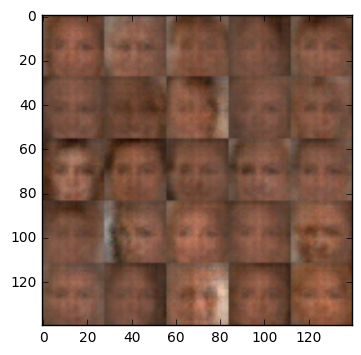

Epoch 1/1... Discriminator Loss: 1.4561... Generator Loss: 0.6997
Epoch 1/1... Discriminator Loss: 1.2980... Generator Loss: 0.6994
Epoch 1/1... Discriminator Loss: 1.5053... Generator Loss: 0.7109
Epoch 1/1... Discriminator Loss: 1.3961... Generator Loss: 0.6843
Epoch 1/1... Discriminator Loss: 1.5045... Generator Loss: 0.7983
Epoch 1/1... Discriminator Loss: 1.3208... Generator Loss: 0.8038
Epoch 1/1... Discriminator Loss: 1.5105... Generator Loss: 0.7380
Epoch 1/1... Discriminator Loss: 1.3518... Generator Loss: 0.6781
Epoch 1/1... Discriminator Loss: 1.3814... Generator Loss: 0.6933
Epoch 1/1... Discriminator Loss: 1.4066... Generator Loss: 0.6959


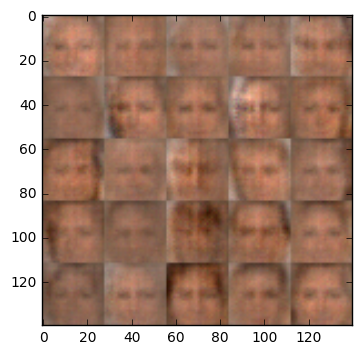

Epoch 1/1... Discriminator Loss: 1.3550... Generator Loss: 0.7034
Epoch 1/1... Discriminator Loss: 1.5685... Generator Loss: 0.7521
Epoch 1/1... Discriminator Loss: 1.2972... Generator Loss: 0.7127
Epoch 1/1... Discriminator Loss: 1.6221... Generator Loss: 0.6038
Epoch 1/1... Discriminator Loss: 1.3027... Generator Loss: 0.7137
Epoch 1/1... Discriminator Loss: 1.3928... Generator Loss: 0.6619
Epoch 1/1... Discriminator Loss: 1.3560... Generator Loss: 0.6273
Epoch 1/1... Discriminator Loss: 1.4018... Generator Loss: 0.6091
Epoch 1/1... Discriminator Loss: 1.2996... Generator Loss: 0.6718
Epoch 1/1... Discriminator Loss: 1.5832... Generator Loss: 0.7793


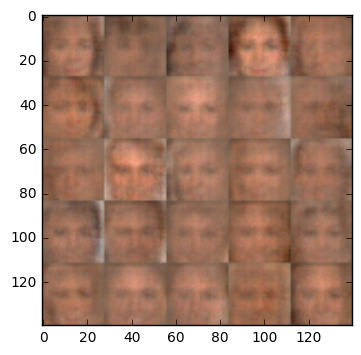

Epoch 1/1... Discriminator Loss: 1.3854... Generator Loss: 0.6446
Epoch 1/1... Discriminator Loss: 1.5277... Generator Loss: 0.6503
Epoch 1/1... Discriminator Loss: 1.4677... Generator Loss: 0.7033
Epoch 1/1... Discriminator Loss: 1.4611... Generator Loss: 0.6701
Epoch 1/1... Discriminator Loss: 1.4096... Generator Loss: 0.7105
Epoch 1/1... Discriminator Loss: 1.4724... Generator Loss: 0.6714
Epoch 1/1... Discriminator Loss: 1.2868... Generator Loss: 0.7043
Epoch 1/1... Discriminator Loss: 1.4475... Generator Loss: 0.6423
Epoch 1/1... Discriminator Loss: 1.4859... Generator Loss: 0.6260
Epoch 1/1... Discriminator Loss: 1.4463... Generator Loss: 0.6915


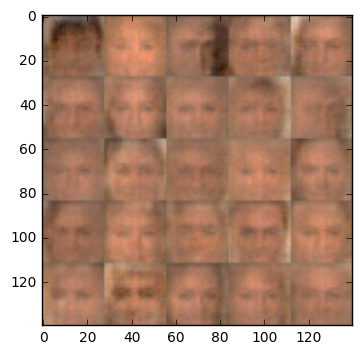

Epoch 1/1... Discriminator Loss: 1.4455... Generator Loss: 0.6871
Epoch 1/1... Discriminator Loss: 1.3539... Generator Loss: 0.6518
Epoch 1/1... Discriminator Loss: 1.3356... Generator Loss: 0.6297
Epoch 1/1... Discriminator Loss: 1.4739... Generator Loss: 0.6432
Epoch 1/1... Discriminator Loss: 1.4699... Generator Loss: 0.6371
Epoch 1/1... Discriminator Loss: 1.3165... Generator Loss: 0.7109
Epoch 1/1... Discriminator Loss: 1.3083... Generator Loss: 0.7045
Epoch 1/1... Discriminator Loss: 1.3762... Generator Loss: 0.7057
Epoch 1/1... Discriminator Loss: 1.3249... Generator Loss: 0.6411
Epoch 1/1... Discriminator Loss: 1.3018... Generator Loss: 0.6922


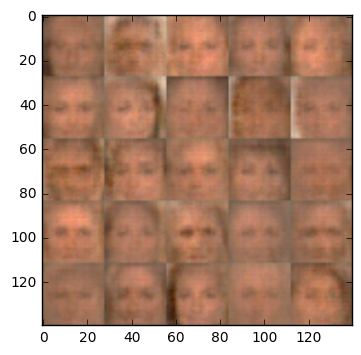

Epoch 1/1... Discriminator Loss: 1.3639... Generator Loss: 0.7355
Epoch 1/1... Discriminator Loss: 1.3345... Generator Loss: 0.7619
Epoch 1/1... Discriminator Loss: 1.5667... Generator Loss: 0.6282
Epoch 1/1... Discriminator Loss: 1.4468... Generator Loss: 0.6354
Epoch 1/1... Discriminator Loss: 1.5450... Generator Loss: 0.6775
Epoch 1/1... Discriminator Loss: 1.4974... Generator Loss: 0.6572
Epoch 1/1... Discriminator Loss: 1.4913... Generator Loss: 0.7019
Epoch 1/1... Discriminator Loss: 1.6187... Generator Loss: 0.6174
Epoch 1/1... Discriminator Loss: 1.3765... Generator Loss: 0.6303
Epoch 1/1... Discriminator Loss: 1.4863... Generator Loss: 0.6290


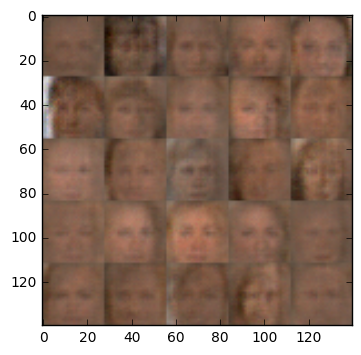

Epoch 1/1... Discriminator Loss: 1.4925... Generator Loss: 0.6946
Epoch 1/1... Discriminator Loss: 1.3605... Generator Loss: 0.6861
Epoch 1/1... Discriminator Loss: 1.2595... Generator Loss: 0.6288
Epoch 1/1... Discriminator Loss: 1.4153... Generator Loss: 0.6613
Epoch 1/1... Discriminator Loss: 1.6409... Generator Loss: 0.6169
Epoch 1/1... Discriminator Loss: 1.4277... Generator Loss: 0.6822
Epoch 1/1... Discriminator Loss: 1.4270... Generator Loss: 0.7006
Epoch 1/1... Discriminator Loss: 1.3706... Generator Loss: 0.6588
Epoch 1/1... Discriminator Loss: 1.3959... Generator Loss: 0.6752
Epoch 1/1... Discriminator Loss: 1.4774... Generator Loss: 0.6921


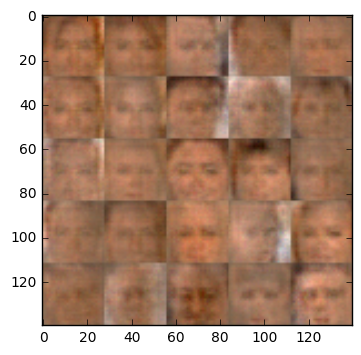

Epoch 1/1... Discriminator Loss: 1.4817... Generator Loss: 0.6260
Epoch 1/1... Discriminator Loss: 1.3810... Generator Loss: 0.6757
Epoch 1/1... Discriminator Loss: 1.5506... Generator Loss: 0.7533
Epoch 1/1... Discriminator Loss: 1.4253... Generator Loss: 0.6802
Epoch 1/1... Discriminator Loss: 1.4220... Generator Loss: 0.6044
Epoch 1/1... Discriminator Loss: 1.3918... Generator Loss: 0.6944
Epoch 1/1... Discriminator Loss: 1.4825... Generator Loss: 0.7101
Epoch 1/1... Discriminator Loss: 1.4054... Generator Loss: 0.6546
Epoch 1/1... Discriminator Loss: 1.4050... Generator Loss: 0.6724
Epoch 1/1... Discriminator Loss: 1.4814... Generator Loss: 0.6302


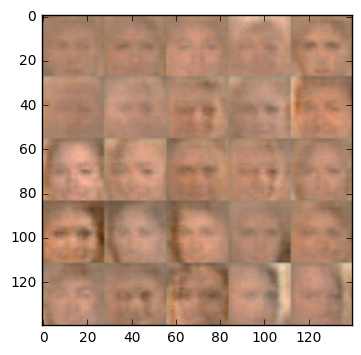

Epoch 1/1... Discriminator Loss: 1.4658... Generator Loss: 0.6342
Epoch 1/1... Discriminator Loss: 1.4429... Generator Loss: 0.5828
Epoch 1/1... Discriminator Loss: 1.4911... Generator Loss: 0.7632
Epoch 1/1... Discriminator Loss: 1.4447... Generator Loss: 0.6372
Epoch 1/1... Discriminator Loss: 1.3485... Generator Loss: 0.6992
Epoch 1/1... Discriminator Loss: 1.3693... Generator Loss: 0.7028
Epoch 1/1... Discriminator Loss: 1.3500... Generator Loss: 0.7108
Epoch 1/1... Discriminator Loss: 1.4357... Generator Loss: 0.6011
Epoch 1/1... Discriminator Loss: 1.3831... Generator Loss: 0.6538
Epoch 1/1... Discriminator Loss: 1.3164... Generator Loss: 0.6456


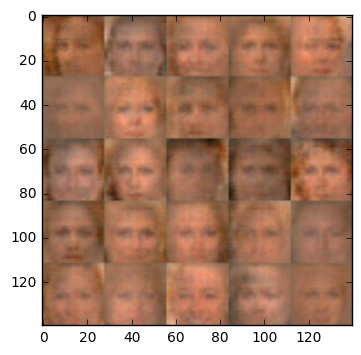

Epoch 1/1... Discriminator Loss: 1.4199... Generator Loss: 0.6428
Epoch 1/1... Discriminator Loss: 1.4822... Generator Loss: 0.6414
Epoch 1/1... Discriminator Loss: 1.3411... Generator Loss: 0.6958
Epoch 1/1... Discriminator Loss: 1.3966... Generator Loss: 0.6454
Epoch 1/1... Discriminator Loss: 1.4091... Generator Loss: 0.7461
Epoch 1/1... Discriminator Loss: 1.3450... Generator Loss: 0.7479
Epoch 1/1... Discriminator Loss: 1.3657... Generator Loss: 0.6431
Epoch 1/1... Discriminator Loss: 1.4675... Generator Loss: 0.6388
Epoch 1/1... Discriminator Loss: 1.4617... Generator Loss: 0.6294
Epoch 1/1... Discriminator Loss: 1.4145... Generator Loss: 0.6623


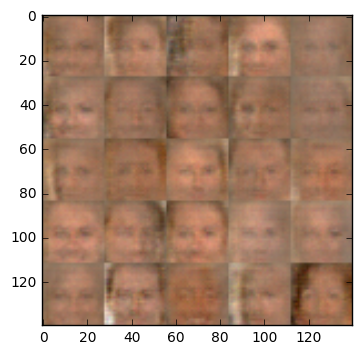

Epoch 1/1... Discriminator Loss: 1.3527... Generator Loss: 0.6855
Epoch 1/1... Discriminator Loss: 1.6052... Generator Loss: 0.6180
Epoch 1/1... Discriminator Loss: 1.3809... Generator Loss: 0.6651
Epoch 1/1... Discriminator Loss: 1.3283... Generator Loss: 0.6776
Epoch 1/1... Discriminator Loss: 1.4398... Generator Loss: 0.6411
Epoch 1/1... Discriminator Loss: 1.4312... Generator Loss: 0.6763
Epoch 1/1... Discriminator Loss: 1.5420... Generator Loss: 0.7021
Epoch 1/1... Discriminator Loss: 1.4087... Generator Loss: 0.7102
Epoch 1/1... Discriminator Loss: 1.4255... Generator Loss: 0.6843
Epoch 1/1... Discriminator Loss: 1.4140... Generator Loss: 0.6894


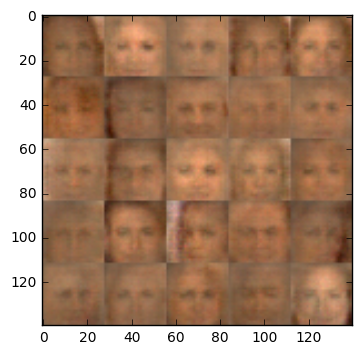

Epoch 1/1... Discriminator Loss: 1.2939... Generator Loss: 0.7299
Epoch 1/1... Discriminator Loss: 1.4276... Generator Loss: 0.6546
Epoch 1/1... Discriminator Loss: 1.3522... Generator Loss: 0.7069
Epoch 1/1... Discriminator Loss: 1.3469... Generator Loss: 0.6584
Epoch 1/1... Discriminator Loss: 1.4624... Generator Loss: 0.6529
Epoch 1/1... Discriminator Loss: 1.4909... Generator Loss: 0.6736
Epoch 1/1... Discriminator Loss: 1.3844... Generator Loss: 0.6409
Epoch 1/1... Discriminator Loss: 1.3266... Generator Loss: 0.6782
Epoch 1/1... Discriminator Loss: 1.4893... Generator Loss: 0.6880
Epoch 1/1... Discriminator Loss: 1.4518... Generator Loss: 0.6305


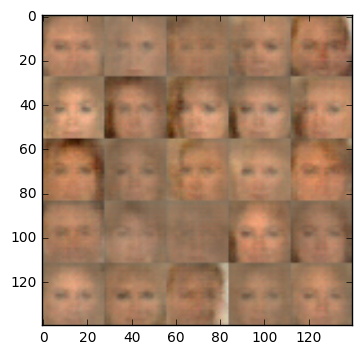

Epoch 1/1... Discriminator Loss: 1.4372... Generator Loss: 0.6219
Epoch 1/1... Discriminator Loss: 1.4406... Generator Loss: 0.6167
Epoch 1/1... Discriminator Loss: 1.3854... Generator Loss: 0.6284
Epoch 1/1... Discriminator Loss: 1.3756... Generator Loss: 0.6399
Epoch 1/1... Discriminator Loss: 1.4494... Generator Loss: 0.6708
Epoch 1/1... Discriminator Loss: 1.4393... Generator Loss: 0.6285
Epoch 1/1... Discriminator Loss: 1.4005... Generator Loss: 0.6364
Epoch 1/1... Discriminator Loss: 1.4852... Generator Loss: 0.6893
Epoch 1/1... Discriminator Loss: 1.4936... Generator Loss: 0.7175
Epoch 1/1... Discriminator Loss: 1.4232... Generator Loss: 0.6555


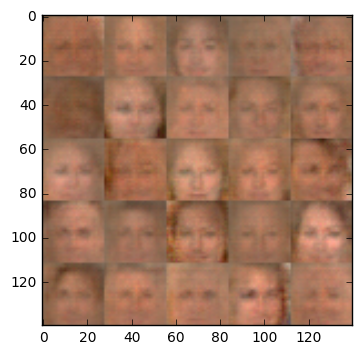

Epoch 1/1... Discriminator Loss: 1.4218... Generator Loss: 0.6262
Epoch 1/1... Discriminator Loss: 1.4728... Generator Loss: 0.7285
Epoch 1/1... Discriminator Loss: 1.3428... Generator Loss: 0.6583
Epoch 1/1... Discriminator Loss: 1.4373... Generator Loss: 0.6530
Epoch 1/1... Discriminator Loss: 1.3964... Generator Loss: 0.6449
Epoch 1/1... Discriminator Loss: 1.4051... Generator Loss: 0.6910
Epoch 1/1... Discriminator Loss: 1.3883... Generator Loss: 0.6770
Epoch 1/1... Discriminator Loss: 1.4323... Generator Loss: 0.7568
Epoch 1/1... Discriminator Loss: 1.4948... Generator Loss: 0.6332
Epoch 1/1... Discriminator Loss: 1.4005... Generator Loss: 0.6615


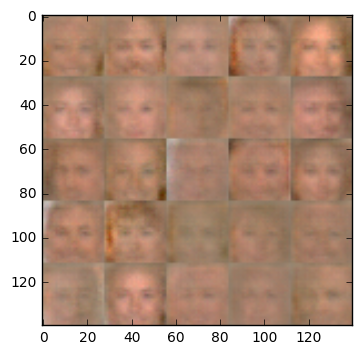

Epoch 1/1... Discriminator Loss: 1.4062... Generator Loss: 0.6558
Epoch 1/1... Discriminator Loss: 1.4474... Generator Loss: 0.6204
Epoch 1/1... Discriminator Loss: 1.3674... Generator Loss: 0.6957
Epoch 1/1... Discriminator Loss: 1.4187... Generator Loss: 0.6429
Epoch 1/1... Discriminator Loss: 1.3715... Generator Loss: 0.6797
Epoch 1/1... Discriminator Loss: 1.3938... Generator Loss: 0.7599
Epoch 1/1... Discriminator Loss: 1.4732... Generator Loss: 0.6614
Epoch 1/1... Discriminator Loss: 1.4694... Generator Loss: 0.6602
Epoch 1/1... Discriminator Loss: 1.4817... Generator Loss: 0.6627
Epoch 1/1... Discriminator Loss: 1.3629... Generator Loss: 0.6596


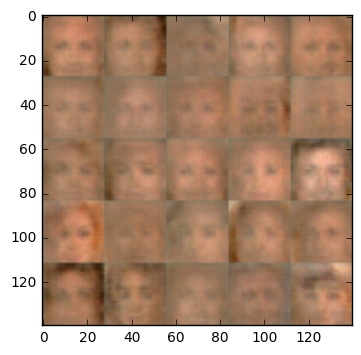

Epoch 1/1... Discriminator Loss: 1.3651... Generator Loss: 0.6435
Epoch 1/1... Discriminator Loss: 1.3783... Generator Loss: 0.6478
Epoch 1/1... Discriminator Loss: 1.4153... Generator Loss: 0.6771
Epoch 1/1... Discriminator Loss: 1.3917... Generator Loss: 0.6509
Epoch 1/1... Discriminator Loss: 1.3931... Generator Loss: 0.6889
Epoch 1/1... Discriminator Loss: 1.3990... Generator Loss: 0.6613
Epoch 1/1... Discriminator Loss: 1.5155... Generator Loss: 0.6366
Epoch 1/1... Discriminator Loss: 1.4382... Generator Loss: 0.6739
Epoch 1/1... Discriminator Loss: 1.4303... Generator Loss: 0.6150
Epoch 1/1... Discriminator Loss: 1.4110... Generator Loss: 0.6491


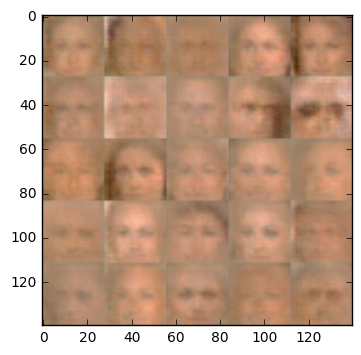

Epoch 1/1... Discriminator Loss: 1.4924... Generator Loss: 0.6652
Epoch 1/1... Discriminator Loss: 1.4422... Generator Loss: 0.6718
Epoch 1/1... Discriminator Loss: 1.4157... Generator Loss: 0.6541
Epoch 1/1... Discriminator Loss: 1.4151... Generator Loss: 0.6753
Epoch 1/1... Discriminator Loss: 1.5401... Generator Loss: 0.6394
Epoch 1/1... Discriminator Loss: 1.4182... Generator Loss: 0.6841
Epoch 1/1... Discriminator Loss: 1.3635... Generator Loss: 0.6563
Epoch 1/1... Discriminator Loss: 1.4567... Generator Loss: 0.6288
Epoch 1/1... Discriminator Loss: 1.5225... Generator Loss: 0.6324
Epoch 1/1... Discriminator Loss: 1.4155... Generator Loss: 0.6874


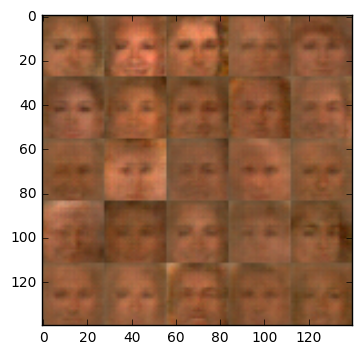

Epoch 1/1... Discriminator Loss: 1.3234... Generator Loss: 0.6994
Epoch 1/1... Discriminator Loss: 1.3748... Generator Loss: 0.7155
Epoch 1/1... Discriminator Loss: 1.4540... Generator Loss: 0.6697
Epoch 1/1... Discriminator Loss: 1.4604... Generator Loss: 0.6761
Epoch 1/1... Discriminator Loss: 1.4004... Generator Loss: 0.6861
Epoch 1/1... Discriminator Loss: 1.4523... Generator Loss: 0.6495
Epoch 1/1... Discriminator Loss: 1.4236... Generator Loss: 0.6825
Epoch 1/1... Discriminator Loss: 1.4180... Generator Loss: 0.6827
Epoch 1/1... Discriminator Loss: 1.4748... Generator Loss: 0.6204
Epoch 1/1... Discriminator Loss: 1.4073... Generator Loss: 0.6331


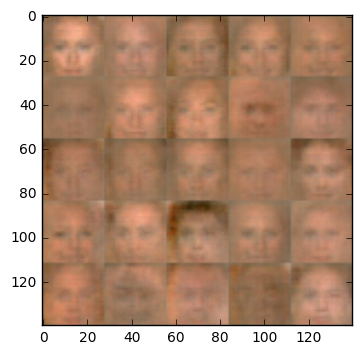

Epoch 1/1... Discriminator Loss: 1.4500... Generator Loss: 0.6354
Epoch 1/1... Discriminator Loss: 1.3968... Generator Loss: 0.6700
Epoch 1/1... Discriminator Loss: 1.4597... Generator Loss: 0.6668
Epoch 1/1... Discriminator Loss: 1.4311... Generator Loss: 0.6761
Epoch 1/1... Discriminator Loss: 1.4469... Generator Loss: 0.6506
Epoch 1/1... Discriminator Loss: 1.3956... Generator Loss: 0.5937
Epoch 1/1... Discriminator Loss: 1.4067... Generator Loss: 0.6467
Epoch 1/1... Discriminator Loss: 1.4573... Generator Loss: 0.6674
Epoch 1/1... Discriminator Loss: 1.3683... Generator Loss: 0.6594
Epoch 1/1... Discriminator Loss: 1.3588... Generator Loss: 0.6945


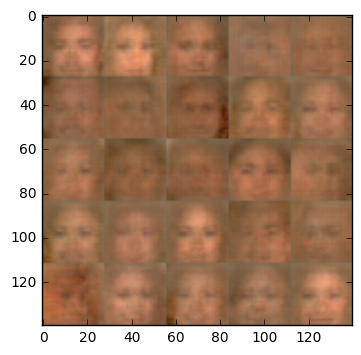

Epoch 1/1... Discriminator Loss: 1.4397... Generator Loss: 0.7265
Epoch 1/1... Discriminator Loss: 1.4111... Generator Loss: 0.6610
Epoch 1/1... Discriminator Loss: 1.4318... Generator Loss: 0.6966
Epoch 1/1... Discriminator Loss: 1.4634... Generator Loss: 0.6741
Epoch 1/1... Discriminator Loss: 1.4090... Generator Loss: 0.6301
Epoch 1/1... Discriminator Loss: 1.3669... Generator Loss: 0.6532
Epoch 1/1... Discriminator Loss: 1.5469... Generator Loss: 0.6001
Epoch 1/1... Discriminator Loss: 1.4290... Generator Loss: 0.7020
Epoch 1/1... Discriminator Loss: 1.4903... Generator Loss: 0.7095
Epoch 1/1... Discriminator Loss: 1.4204... Generator Loss: 0.6358


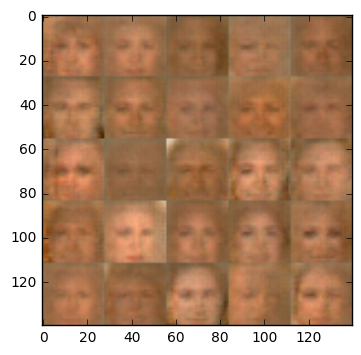

Epoch 1/1... Discriminator Loss: 1.3856... Generator Loss: 0.7140
Epoch 1/1... Discriminator Loss: 1.3405... Generator Loss: 0.6527
Epoch 1/1... Discriminator Loss: 1.4507... Generator Loss: 0.6767
Epoch 1/1... Discriminator Loss: 1.4403... Generator Loss: 0.6297
Epoch 1/1... Discriminator Loss: 1.5297... Generator Loss: 0.6509
Epoch 1/1... Discriminator Loss: 1.4642... Generator Loss: 0.6003
Epoch 1/1... Discriminator Loss: 1.5643... Generator Loss: 0.6625
Epoch 1/1... Discriminator Loss: 1.4882... Generator Loss: 0.6654
Epoch 1/1... Discriminator Loss: 1.3683... Generator Loss: 0.6761
Epoch 1/1... Discriminator Loss: 1.3663... Generator Loss: 0.6608


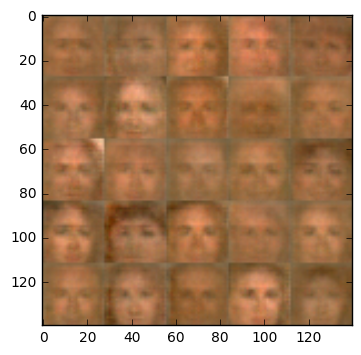

Epoch 1/1... Discriminator Loss: 1.4264... Generator Loss: 0.6279
Epoch 1/1... Discriminator Loss: 1.4567... Generator Loss: 0.6707
Epoch 1/1... Discriminator Loss: 1.3199... Generator Loss: 0.6913
Epoch 1/1... Discriminator Loss: 1.5201... Generator Loss: 0.6537
Epoch 1/1... Discriminator Loss: 1.4432... Generator Loss: 0.6350
Epoch 1/1... Discriminator Loss: 1.3705... Generator Loss: 0.6356
Epoch 1/1... Discriminator Loss: 1.4950... Generator Loss: 0.6999
Epoch 1/1... Discriminator Loss: 1.2903... Generator Loss: 0.6419
Epoch 1/1... Discriminator Loss: 1.3492... Generator Loss: 0.6850
Epoch 1/1... Discriminator Loss: 1.4172... Generator Loss: 0.6871


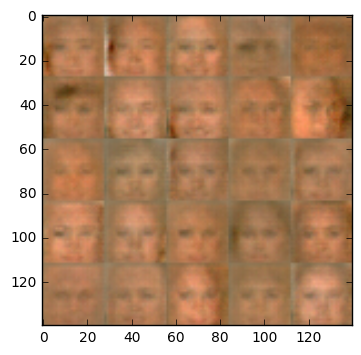

Epoch 1/1... Discriminator Loss: 1.4257... Generator Loss: 0.6178
Epoch 1/1... Discriminator Loss: 1.3580... Generator Loss: 0.7455
Epoch 1/1... Discriminator Loss: 1.4090... Generator Loss: 0.6954
Epoch 1/1... Discriminator Loss: 1.4400... Generator Loss: 0.6433
Epoch 1/1... Discriminator Loss: 1.4158... Generator Loss: 0.6800
Epoch 1/1... Discriminator Loss: 1.4256... Generator Loss: 0.7042
Epoch 1/1... Discriminator Loss: 1.3976... Generator Loss: 0.6987
Epoch 1/1... Discriminator Loss: 1.3366... Generator Loss: 0.6745
Epoch 1/1... Discriminator Loss: 1.4688... Generator Loss: 0.7085
Epoch 1/1... Discriminator Loss: 1.4095... Generator Loss: 0.7046


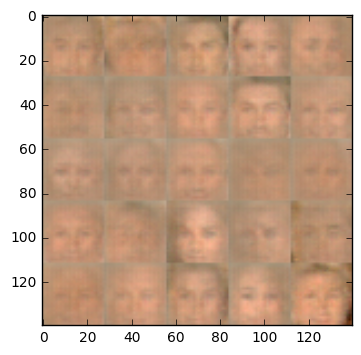

Epoch 1/1... Discriminator Loss: 1.4525... Generator Loss: 0.6508
Epoch 1/1... Discriminator Loss: 1.3282... Generator Loss: 0.6855
Epoch 1/1... Discriminator Loss: 1.4639... Generator Loss: 0.7296
Epoch 1/1... Discriminator Loss: 1.3715... Generator Loss: 0.6860
Epoch 1/1... Discriminator Loss: 1.4972... Generator Loss: 0.6738
Epoch 1/1... Discriminator Loss: 1.5270... Generator Loss: 0.7110
Epoch 1/1... Discriminator Loss: 1.4353... Generator Loss: 0.6618
Epoch 1/1... Discriminator Loss: 1.5660... Generator Loss: 0.6487
Epoch 1/1... Discriminator Loss: 1.3752... Generator Loss: 0.6530
Epoch 1/1... Discriminator Loss: 1.3125... Generator Loss: 0.6619


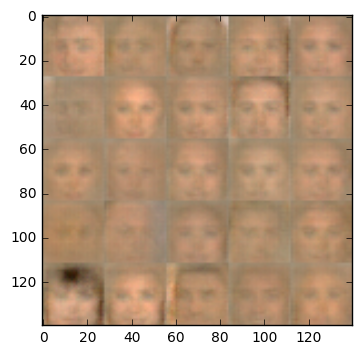

Epoch 1/1... Discriminator Loss: 1.5627... Generator Loss: 0.6021
Epoch 1/1... Discriminator Loss: 1.4298... Generator Loss: 0.6829
Epoch 1/1... Discriminator Loss: 1.4408... Generator Loss: 0.7156
Epoch 1/1... Discriminator Loss: 1.5423... Generator Loss: 0.6551
Epoch 1/1... Discriminator Loss: 1.4062... Generator Loss: 0.6884
Epoch 1/1... Discriminator Loss: 1.3567... Generator Loss: 0.6441
Epoch 1/1... Discriminator Loss: 1.4273... Generator Loss: 0.6556
Epoch 1/1... Discriminator Loss: 1.4497... Generator Loss: 0.6574
Epoch 1/1... Discriminator Loss: 1.5606... Generator Loss: 0.6106
Epoch 1/1... Discriminator Loss: 1.3892... Generator Loss: 0.7155


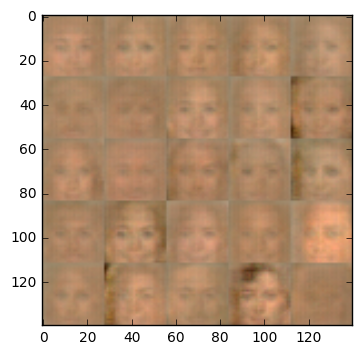

Epoch 1/1... Discriminator Loss: 1.5839... Generator Loss: 0.6246
Epoch 1/1... Discriminator Loss: 1.4194... Generator Loss: 0.6398
Epoch 1/1... Discriminator Loss: 1.3955... Generator Loss: 0.6494
Epoch 1/1... Discriminator Loss: 1.5555... Generator Loss: 0.6638
Epoch 1/1... Discriminator Loss: 1.4279... Generator Loss: 0.6553
Epoch 1/1... Discriminator Loss: 1.4071... Generator Loss: 0.6842
Epoch 1/1... Discriminator Loss: 1.4110... Generator Loss: 0.6338
Epoch 1/1... Discriminator Loss: 1.4101... Generator Loss: 0.6379
Epoch 1/1... Discriminator Loss: 1.4171... Generator Loss: 0.7070
Epoch 1/1... Discriminator Loss: 1.4872... Generator Loss: 0.6410


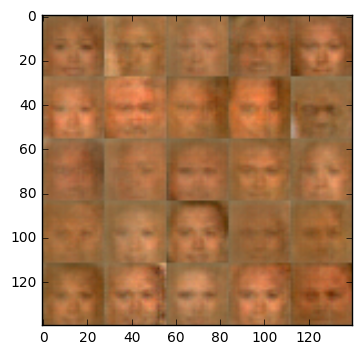

Epoch 1/1... Discriminator Loss: 1.3737... Generator Loss: 0.6299
Epoch 1/1... Discriminator Loss: 1.3585... Generator Loss: 0.6806
Epoch 1/1... Discriminator Loss: 1.5847... Generator Loss: 0.6032
Epoch 1/1... Discriminator Loss: 1.4620... Generator Loss: 0.6155
Epoch 1/1... Discriminator Loss: 1.4989... Generator Loss: 0.6181
Epoch 1/1... Discriminator Loss: 1.3711... Generator Loss: 0.6651
Epoch 1/1... Discriminator Loss: 1.4399... Generator Loss: 0.6384
Epoch 1/1... Discriminator Loss: 1.4126... Generator Loss: 0.6590
Epoch 1/1... Discriminator Loss: 1.3344... Generator Loss: 0.7154
Epoch 1/1... Discriminator Loss: 1.4491... Generator Loss: 0.6624


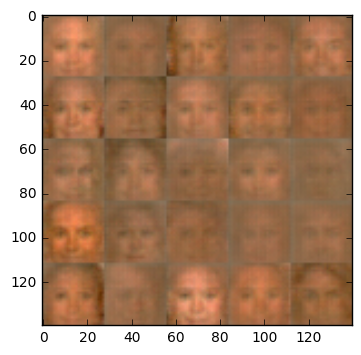

Epoch 1/1... Discriminator Loss: 1.4430... Generator Loss: 0.6954
Epoch 1/1... Discriminator Loss: 1.4088... Generator Loss: 0.6628
Epoch 1/1... Discriminator Loss: 1.6071... Generator Loss: 0.6277
Epoch 1/1... Discriminator Loss: 1.4437... Generator Loss: 0.7103
Epoch 1/1... Discriminator Loss: 1.5303... Generator Loss: 0.6121
Epoch 1/1... Discriminator Loss: 1.4071... Generator Loss: 0.6588
Epoch 1/1... Discriminator Loss: 1.2824... Generator Loss: 0.6647
Epoch 1/1... Discriminator Loss: 1.4086... Generator Loss: 0.6354
Epoch 1/1... Discriminator Loss: 1.3315... Generator Loss: 0.6113
Epoch 1/1... Discriminator Loss: 1.5312... Generator Loss: 0.6613


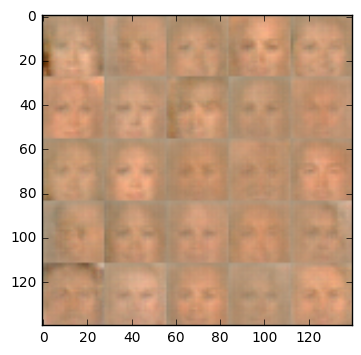

Epoch 1/1... Discriminator Loss: 1.4615... Generator Loss: 0.6626
Epoch 1/1... Discriminator Loss: 1.4334... Generator Loss: 0.6683
Epoch 1/1... Discriminator Loss: 1.4997... Generator Loss: 0.6475
Epoch 1/1... Discriminator Loss: 1.5309... Generator Loss: 0.6235
Epoch 1/1... Discriminator Loss: 1.5071... Generator Loss: 0.6995
Epoch 1/1... Discriminator Loss: 1.3941... Generator Loss: 0.6411
Epoch 1/1... Discriminator Loss: 1.4028... Generator Loss: 0.6288
Epoch 1/1... Discriminator Loss: 1.4571... Generator Loss: 0.7350
Epoch 1/1... Discriminator Loss: 1.5133... Generator Loss: 0.6129
Epoch 1/1... Discriminator Loss: 1.3874... Generator Loss: 0.7268


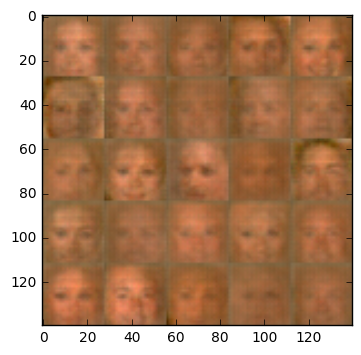

Epoch 1/1... Discriminator Loss: 1.4041... Generator Loss: 0.6454
Epoch 1/1... Discriminator Loss: 1.4547... Generator Loss: 0.6791
Epoch 1/1... Discriminator Loss: 1.5122... Generator Loss: 0.6963
Epoch 1/1... Discriminator Loss: 1.5498... Generator Loss: 0.6417
Epoch 1/1... Discriminator Loss: 1.3785... Generator Loss: 0.6572
Epoch 1/1... Discriminator Loss: 1.3626... Generator Loss: 0.6479
Epoch 1/1... Discriminator Loss: 1.4537... Generator Loss: 0.6882
Epoch 1/1... Discriminator Loss: 1.4632... Generator Loss: 0.6755
Epoch 1/1... Discriminator Loss: 1.4859... Generator Loss: 0.6475
Epoch 1/1... Discriminator Loss: 1.4573... Generator Loss: 0.6552


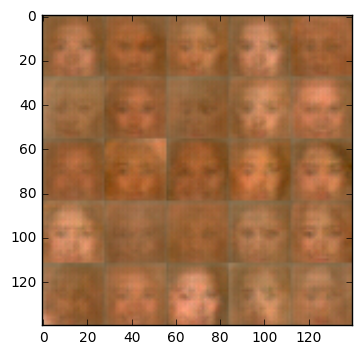

Epoch 1/1... Discriminator Loss: 1.3819... Generator Loss: 0.6964
Epoch 1/1... Discriminator Loss: 1.3585... Generator Loss: 0.6600
Epoch 1/1... Discriminator Loss: 1.3159... Generator Loss: 0.6845
Epoch 1/1... Discriminator Loss: 1.4918... Generator Loss: 0.6366
Epoch 1/1... Discriminator Loss: 1.3196... Generator Loss: 0.6747
Epoch 1/1... Discriminator Loss: 1.4422... Generator Loss: 0.6896
Epoch 1/1... Discriminator Loss: 1.4674... Generator Loss: 0.6267
Epoch 1/1... Discriminator Loss: 1.4594... Generator Loss: 0.6281
Epoch 1/1... Discriminator Loss: 1.3976... Generator Loss: 0.7411
Epoch 1/1... Discriminator Loss: 1.5221... Generator Loss: 0.6245


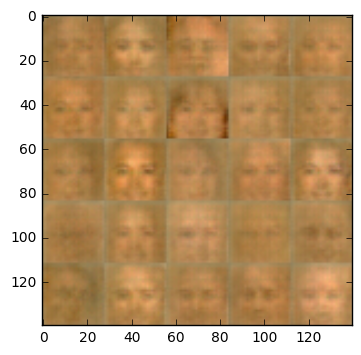

Epoch 1/1... Discriminator Loss: 1.4945... Generator Loss: 0.6250
Epoch 1/1... Discriminator Loss: 1.4138... Generator Loss: 0.6622
Epoch 1/1... Discriminator Loss: 1.4127... Generator Loss: 0.6813
Epoch 1/1... Discriminator Loss: 1.4304... Generator Loss: 0.6357
Epoch 1/1... Discriminator Loss: 1.4516... Generator Loss: 0.6834
Epoch 1/1... Discriminator Loss: 1.3855... Generator Loss: 0.6548
Epoch 1/1... Discriminator Loss: 1.4682... Generator Loss: 0.6368
Epoch 1/1... Discriminator Loss: 1.3811... Generator Loss: 0.6575
Epoch 1/1... Discriminator Loss: 1.4011... Generator Loss: 0.7013
Epoch 1/1... Discriminator Loss: 1.3497... Generator Loss: 0.6300


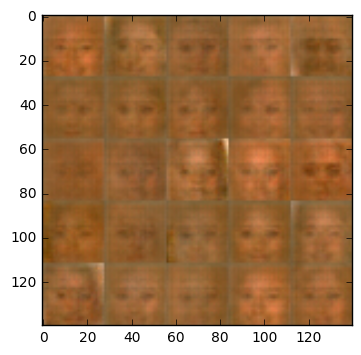

Epoch 1/1... Discriminator Loss: 1.4379... Generator Loss: 0.6269
Epoch 1/1... Discriminator Loss: 1.4110... Generator Loss: 0.6454
Epoch 1/1... Discriminator Loss: 1.4037... Generator Loss: 0.6646
Epoch 1/1... Discriminator Loss: 1.4758... Generator Loss: 0.6383
Epoch 1/1... Discriminator Loss: 1.5553... Generator Loss: 0.6116
Epoch 1/1... Discriminator Loss: 1.4611... Generator Loss: 0.6394
Epoch 1/1... Discriminator Loss: 1.4070... Generator Loss: 0.5761
Epoch 1/1... Discriminator Loss: 1.4331... Generator Loss: 0.6885
Epoch 1/1... Discriminator Loss: 1.3913... Generator Loss: 0.7266
Epoch 1/1... Discriminator Loss: 1.5313... Generator Loss: 0.6480


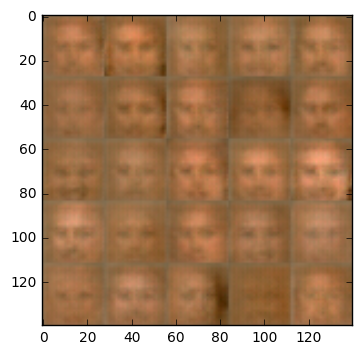

Epoch 1/1... Discriminator Loss: 1.4627... Generator Loss: 0.6488
Epoch 1/1... Discriminator Loss: 1.3348... Generator Loss: 0.6391
Epoch 1/1... Discriminator Loss: 1.5514... Generator Loss: 0.6567
Epoch 1/1... Discriminator Loss: 1.3497... Generator Loss: 0.7140
Epoch 1/1... Discriminator Loss: 1.4348... Generator Loss: 0.6612
Epoch 1/1... Discriminator Loss: 1.6232... Generator Loss: 0.5887
Epoch 1/1... Discriminator Loss: 1.4580... Generator Loss: 0.7014
Epoch 1/1... Discriminator Loss: 1.3841... Generator Loss: 0.6244
Epoch 1/1... Discriminator Loss: 1.2574... Generator Loss: 0.6844
Epoch 1/1... Discriminator Loss: 1.5657... Generator Loss: 0.6800


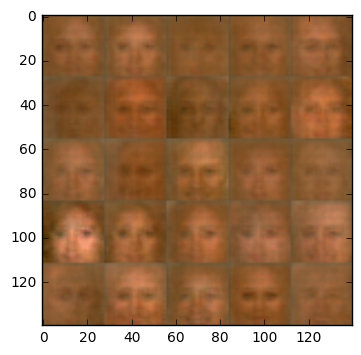

Epoch 1/1... Discriminator Loss: 1.4123... Generator Loss: 0.7150
Epoch 1/1... Discriminator Loss: 1.4237... Generator Loss: 0.6293
Epoch 1/1... Discriminator Loss: 1.4626... Generator Loss: 0.6679
Epoch 1/1... Discriminator Loss: 1.5240... Generator Loss: 0.6370
Epoch 1/1... Discriminator Loss: 1.5088... Generator Loss: 0.6345
Epoch 1/1... Discriminator Loss: 1.4527... Generator Loss: 0.6703
Epoch 1/1... Discriminator Loss: 1.4842... Generator Loss: 0.6307
Epoch 1/1... Discriminator Loss: 1.3916... Generator Loss: 0.6998
Epoch 1/1... Discriminator Loss: 1.2790... Generator Loss: 0.5890
Epoch 1/1... Discriminator Loss: 1.4759... Generator Loss: 0.6957


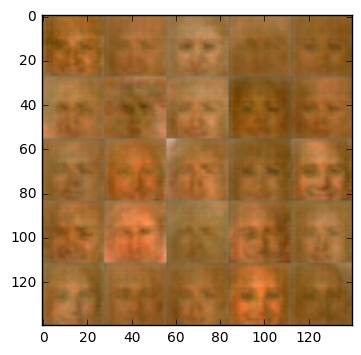

Epoch 1/1... Discriminator Loss: 1.5050... Generator Loss: 0.6595
Epoch 1/1... Discriminator Loss: 1.2916... Generator Loss: 0.6531
Epoch 1/1... Discriminator Loss: 1.3644... Generator Loss: 0.6621
Epoch 1/1... Discriminator Loss: 1.3872... Generator Loss: 0.6221
Epoch 1/1... Discriminator Loss: 1.2197... Generator Loss: 0.6971
Epoch 1/1... Discriminator Loss: 1.4608... Generator Loss: 0.6488
Epoch 1/1... Discriminator Loss: 1.4183... Generator Loss: 0.6742
Epoch 1/1... Discriminator Loss: 1.7981... Generator Loss: 0.6175
Epoch 1/1... Discriminator Loss: 1.4735... Generator Loss: 0.6158
Epoch 1/1... Discriminator Loss: 1.3547... Generator Loss: 0.6383


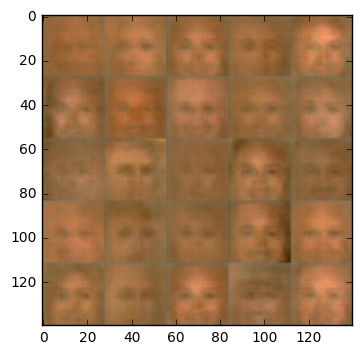

Epoch 1/1... Discriminator Loss: 1.4457... Generator Loss: 0.6435
Epoch 1/1... Discriminator Loss: 1.4907... Generator Loss: 0.7526
Epoch 1/1... Discriminator Loss: 1.3853... Generator Loss: 0.6740
Epoch 1/1... Discriminator Loss: 1.3917... Generator Loss: 0.6949
Epoch 1/1... Discriminator Loss: 1.4940... Generator Loss: 0.6391
Epoch 1/1... Discriminator Loss: 1.5131... Generator Loss: 0.6134
Epoch 1/1... Discriminator Loss: 1.4135... Generator Loss: 0.6218
Epoch 1/1... Discriminator Loss: 1.2936... Generator Loss: 0.6866
Epoch 1/1... Discriminator Loss: 1.4393... Generator Loss: 0.6548
Epoch 1/1... Discriminator Loss: 1.4499... Generator Loss: 0.6533


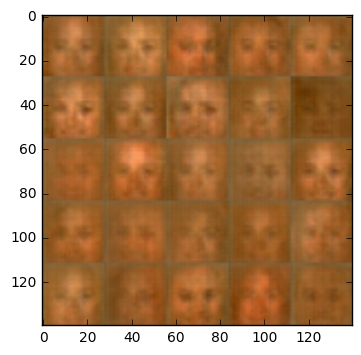

Epoch 1/1... Discriminator Loss: 1.3741... Generator Loss: 0.6480
Epoch 1/1... Discriminator Loss: 1.5156... Generator Loss: 0.6470
Epoch 1/1... Discriminator Loss: 1.4130... Generator Loss: 0.6697
Epoch 1/1... Discriminator Loss: 1.4005... Generator Loss: 0.6912
Epoch 1/1... Discriminator Loss: 1.3651... Generator Loss: 0.6932
Epoch 1/1... Discriminator Loss: 1.4872... Generator Loss: 0.6363
Epoch 1/1... Discriminator Loss: 1.4543... Generator Loss: 0.6484
Epoch 1/1... Discriminator Loss: 1.4332... Generator Loss: 0.6513
Epoch 1/1... Discriminator Loss: 1.4409... Generator Loss: 0.6832
Epoch 1/1... Discriminator Loss: 1.3972... Generator Loss: 0.6877


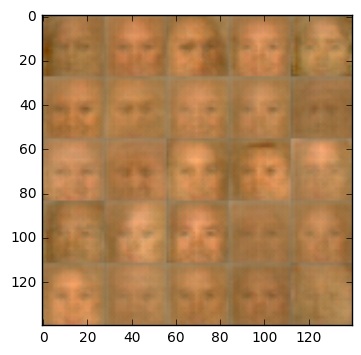

Epoch 1/1... Discriminator Loss: 1.4932... Generator Loss: 0.6337
Epoch 1/1... Discriminator Loss: 1.5024... Generator Loss: 0.6254
Epoch 1/1... Discriminator Loss: 1.3611... Generator Loss: 0.6691
Epoch 1/1... Discriminator Loss: 1.4832... Generator Loss: 0.6569
Epoch 1/1... Discriminator Loss: 1.5732... Generator Loss: 0.6410
Epoch 1/1... Discriminator Loss: 1.3852... Generator Loss: 0.6284
Epoch 1/1... Discriminator Loss: 1.4525... Generator Loss: 0.6670
Epoch 1/1... Discriminator Loss: 1.4188... Generator Loss: 0.6949
Epoch 1/1... Discriminator Loss: 1.4163... Generator Loss: 0.6413
Epoch 1/1... Discriminator Loss: 1.3891... Generator Loss: 0.6771


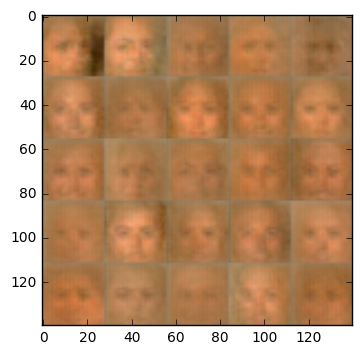

Epoch 1/1... Discriminator Loss: 1.5070... Generator Loss: 0.6421
Epoch 1/1... Discriminator Loss: 1.3443... Generator Loss: 0.7406
Epoch 1/1... Discriminator Loss: 1.3275... Generator Loss: 0.6719
Epoch 1/1... Discriminator Loss: 1.4507... Generator Loss: 0.6772
Epoch 1/1... Discriminator Loss: 1.4179... Generator Loss: 0.6407
Epoch 1/1... Discriminator Loss: 1.4374... Generator Loss: 0.6811
Epoch 1/1... Discriminator Loss: 1.5305... Generator Loss: 0.6621
Epoch 1/1... Discriminator Loss: 1.4498... Generator Loss: 0.6640
Epoch 1/1... Discriminator Loss: 1.4510... Generator Loss: 0.6390
Epoch 1/1... Discriminator Loss: 1.3963... Generator Loss: 0.7184


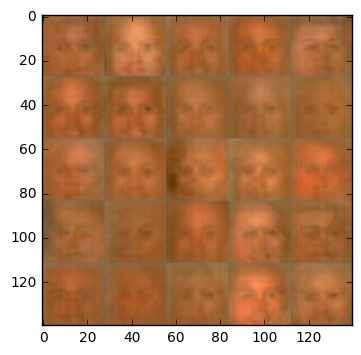

Epoch 1/1... Discriminator Loss: 1.5775... Generator Loss: 0.6413
Epoch 1/1... Discriminator Loss: 1.4065... Generator Loss: 0.6692
Epoch 1/1... Discriminator Loss: 1.4978... Generator Loss: 0.6180
Epoch 1/1... Discriminator Loss: 1.4147... Generator Loss: 0.6273
Epoch 1/1... Discriminator Loss: 1.4266... Generator Loss: 0.6757
Epoch 1/1... Discriminator Loss: 1.3502... Generator Loss: 0.6690
Epoch 1/1... Discriminator Loss: 1.4602... Generator Loss: 0.6524
Epoch 1/1... Discriminator Loss: 1.5664... Generator Loss: 0.5931
Epoch 1/1... Discriminator Loss: 1.2344... Generator Loss: 0.6667
Epoch 1/1... Discriminator Loss: 1.3798... Generator Loss: 0.6558


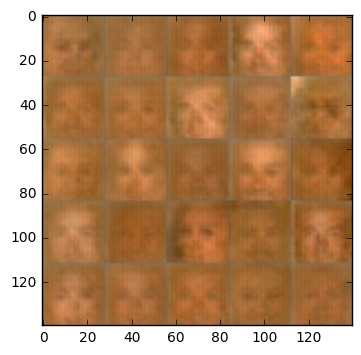

Epoch 1/1... Discriminator Loss: 1.6293... Generator Loss: 0.5777
Epoch 1/1... Discriminator Loss: 1.3824... Generator Loss: 0.6695
Epoch 1/1... Discriminator Loss: 1.4837... Generator Loss: 0.7544
Epoch 1/1... Discriminator Loss: 1.4693... Generator Loss: 0.6062
Epoch 1/1... Discriminator Loss: 1.4497... Generator Loss: 0.6257
Epoch 1/1... Discriminator Loss: 1.3483... Generator Loss: 0.6571
Epoch 1/1... Discriminator Loss: 1.3411... Generator Loss: 0.7040
Epoch 1/1... Discriminator Loss: 1.4953... Generator Loss: 0.6189
Epoch 1/1... Discriminator Loss: 1.5195... Generator Loss: 0.6282
Epoch 1/1... Discriminator Loss: 1.5734... Generator Loss: 0.6214


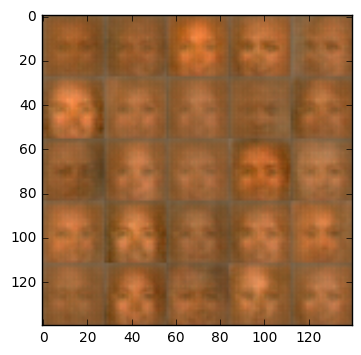

Epoch 1/1... Discriminator Loss: 1.6088... Generator Loss: 0.5996
Epoch 1/1... Discriminator Loss: 1.5402... Generator Loss: 0.6226
Epoch 1/1... Discriminator Loss: 1.4194... Generator Loss: 0.6830
Epoch 1/1... Discriminator Loss: 1.5100... Generator Loss: 0.6610
Epoch 1/1... Discriminator Loss: 1.5377... Generator Loss: 0.6995
Epoch 1/1... Discriminator Loss: 1.4634... Generator Loss: 0.6699
Epoch 1/1... Discriminator Loss: 1.4866... Generator Loss: 0.6269
Epoch 1/1... Discriminator Loss: 1.5111... Generator Loss: 0.6365
Epoch 1/1... Discriminator Loss: 1.3382... Generator Loss: 0.7036
Epoch 1/1... Discriminator Loss: 1.4942... Generator Loss: 0.6901


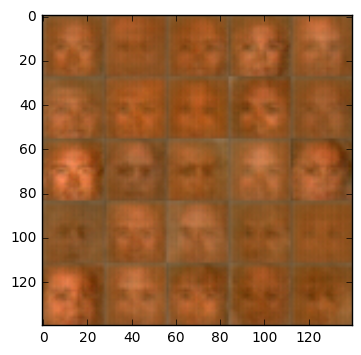

Epoch 1/1... Discriminator Loss: 1.4357... Generator Loss: 0.7304
Epoch 1/1... Discriminator Loss: 1.4000... Generator Loss: 0.6297
Epoch 1/1... Discriminator Loss: 1.3193... Generator Loss: 0.6387
Epoch 1/1... Discriminator Loss: 1.3771... Generator Loss: 0.6588
Epoch 1/1... Discriminator Loss: 1.4234... Generator Loss: 0.6292
Epoch 1/1... Discriminator Loss: 1.3621... Generator Loss: 0.6508
Epoch 1/1... Discriminator Loss: 1.2881... Generator Loss: 0.6691
Epoch 1/1... Discriminator Loss: 1.6254... Generator Loss: 0.6471
Epoch 1/1... Discriminator Loss: 1.3851... Generator Loss: 0.6305
Epoch 1/1... Discriminator Loss: 1.3463... Generator Loss: 0.6489


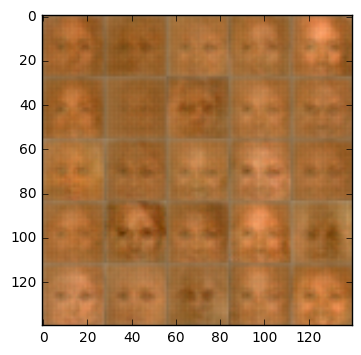

Epoch 1/1... Discriminator Loss: 1.4260... Generator Loss: 0.6335
Epoch 1/1... Discriminator Loss: 1.3882... Generator Loss: 0.6538
Epoch 1/1... Discriminator Loss: 1.5051... Generator Loss: 0.6020
Epoch 1/1... Discriminator Loss: 1.4972... Generator Loss: 0.6461
Epoch 1/1... Discriminator Loss: 1.5502... Generator Loss: 0.7156
Epoch 1/1... Discriminator Loss: 1.3831... Generator Loss: 0.6482
Epoch 1/1... Discriminator Loss: 1.7337... Generator Loss: 0.6658
Epoch 1/1... Discriminator Loss: 1.4686... Generator Loss: 0.7193
Epoch 1/1... Discriminator Loss: 1.5313... Generator Loss: 0.6326
Epoch 1/1... Discriminator Loss: 1.2745... Generator Loss: 0.6227


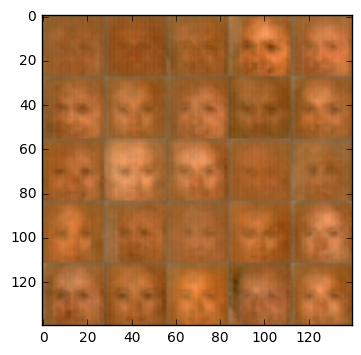

Epoch 1/1... Discriminator Loss: 1.4136... Generator Loss: 0.7270
Epoch 1/1... Discriminator Loss: 1.5308... Generator Loss: 0.6635
Epoch 1/1... Discriminator Loss: 1.3064... Generator Loss: 0.6786
Epoch 1/1... Discriminator Loss: 1.4129... Generator Loss: 0.6726
Epoch 1/1... Discriminator Loss: 1.4765... Generator Loss: 0.6797
Epoch 1/1... Discriminator Loss: 1.4174... Generator Loss: 0.6745
Epoch 1/1... Discriminator Loss: 1.4336... Generator Loss: 0.6363
Epoch 1/1... Discriminator Loss: 1.4250... Generator Loss: 0.6399
Epoch 1/1... Discriminator Loss: 1.5030... Generator Loss: 0.6402
Epoch 1/1... Discriminator Loss: 1.4394... Generator Loss: 0.6880


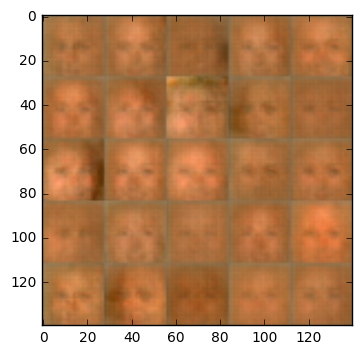

Epoch 1/1... Discriminator Loss: 1.4759... Generator Loss: 0.6789
Epoch 1/1... Discriminator Loss: 1.4421... Generator Loss: 0.6384
Epoch 1/1... Discriminator Loss: 1.3919... Generator Loss: 0.6769
Epoch 1/1... Discriminator Loss: 1.4645... Generator Loss: 0.6493
Epoch 1/1... Discriminator Loss: 1.3910... Generator Loss: 0.6844
Epoch 1/1... Discriminator Loss: 1.4429... Generator Loss: 0.6401
Epoch 1/1... Discriminator Loss: 1.3981... Generator Loss: 0.6547
Epoch 1/1... Discriminator Loss: 1.4787... Generator Loss: 0.6252
Epoch 1/1... Discriminator Loss: 1.3458... Generator Loss: 0.6592
Epoch 1/1... Discriminator Loss: 1.3485... Generator Loss: 0.6834


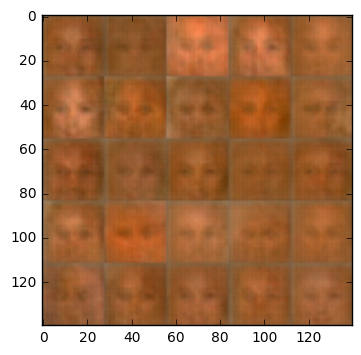

Epoch 1/1... Discriminator Loss: 1.4032... Generator Loss: 0.6672
Epoch 1/1... Discriminator Loss: 1.6285... Generator Loss: 0.6125
Epoch 1/1... Discriminator Loss: 1.5455... Generator Loss: 0.6761
Epoch 1/1... Discriminator Loss: 1.3860... Generator Loss: 0.6601
Epoch 1/1... Discriminator Loss: 1.3599... Generator Loss: 0.6772
Epoch 1/1... Discriminator Loss: 1.5868... Generator Loss: 0.6357
Epoch 1/1... Discriminator Loss: 1.4677... Generator Loss: 0.6837
Epoch 1/1... Discriminator Loss: 1.3854... Generator Loss: 0.6900
Epoch 1/1... Discriminator Loss: 1.4953... Generator Loss: 0.6308
Epoch 1/1... Discriminator Loss: 1.2963... Generator Loss: 0.6804


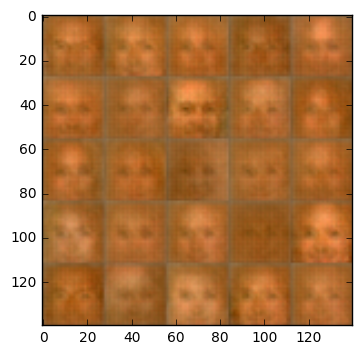

Epoch 1/1... Discriminator Loss: 1.3468... Generator Loss: 0.7104
Epoch 1/1... Discriminator Loss: 1.4803... Generator Loss: 0.6664
Epoch 1/1... Discriminator Loss: 1.4410... Generator Loss: 0.6551
Epoch 1/1... Discriminator Loss: 1.3992... Generator Loss: 0.6364
Epoch 1/1... Discriminator Loss: 1.5089... Generator Loss: 0.6276
Epoch 1/1... Discriminator Loss: 1.4698... Generator Loss: 0.6131
Epoch 1/1... Discriminator Loss: 1.6403... Generator Loss: 0.6363
Epoch 1/1... Discriminator Loss: 1.5484... Generator Loss: 0.6303
Epoch 1/1... Discriminator Loss: 1.3888... Generator Loss: 0.6400
Epoch 1/1... Discriminator Loss: 1.5049... Generator Loss: 0.6345


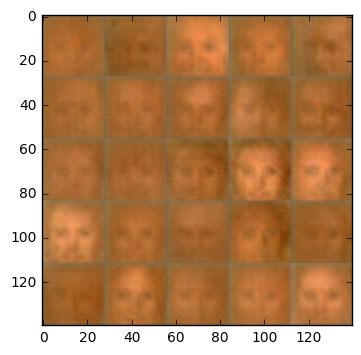

Epoch 1/1... Discriminator Loss: 1.3403... Generator Loss: 0.6532
Epoch 1/1... Discriminator Loss: 1.3788... Generator Loss: 0.6440
Epoch 1/1... Discriminator Loss: 1.5285... Generator Loss: 0.6536
Epoch 1/1... Discriminator Loss: 1.4458... Generator Loss: 0.6350
Epoch 1/1... Discriminator Loss: 1.6517... Generator Loss: 0.6148
Epoch 1/1... Discriminator Loss: 1.3982... Generator Loss: 0.6580
Epoch 1/1... Discriminator Loss: 1.4381... Generator Loss: 0.6246
Epoch 1/1... Discriminator Loss: 1.4821... Generator Loss: 0.6505
Epoch 1/1... Discriminator Loss: 1.3969... Generator Loss: 0.6372
Epoch 1/1... Discriminator Loss: 1.5186... Generator Loss: 0.6157


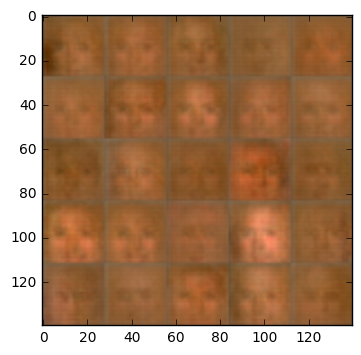

Epoch 1/1... Discriminator Loss: 1.5544... Generator Loss: 0.6158
Epoch 1/1... Discriminator Loss: 1.5597... Generator Loss: 0.6175
Epoch 1/1... Discriminator Loss: 1.4689... Generator Loss: 0.6696
Epoch 1/1... Discriminator Loss: 1.6112... Generator Loss: 0.6152
Epoch 1/1... Discriminator Loss: 1.5101... Generator Loss: 0.6246
Epoch 1/1... Discriminator Loss: 1.3591... Generator Loss: 0.6879
Epoch 1/1... Discriminator Loss: 1.6002... Generator Loss: 0.6159
Epoch 1/1... Discriminator Loss: 1.4648... Generator Loss: 0.6933
Epoch 1/1... Discriminator Loss: 1.6763... Generator Loss: 0.6447
Epoch 1/1... Discriminator Loss: 1.4508... Generator Loss: 0.6278


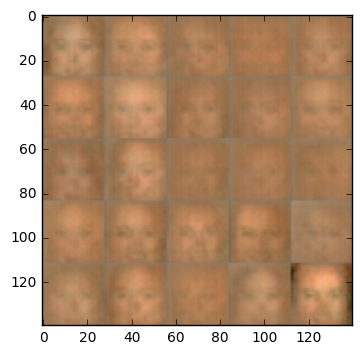

Epoch 1/1... Discriminator Loss: 1.4981... Generator Loss: 0.6441
Epoch 1/1... Discriminator Loss: 1.4115... Generator Loss: 0.7324
Epoch 1/1... Discriminator Loss: 1.3778... Generator Loss: 0.6062
Epoch 1/1... Discriminator Loss: 1.4009... Generator Loss: 0.6291
Epoch 1/1... Discriminator Loss: 1.4550... Generator Loss: 0.6798
Epoch 1/1... Discriminator Loss: 1.5789... Generator Loss: 0.6571
Epoch 1/1... Discriminator Loss: 1.3989... Generator Loss: 0.6371
Epoch 1/1... Discriminator Loss: 1.3497... Generator Loss: 0.7181
Epoch 1/1... Discriminator Loss: 1.4115... Generator Loss: 0.6671
Epoch 1/1... Discriminator Loss: 1.3829... Generator Loss: 0.6442


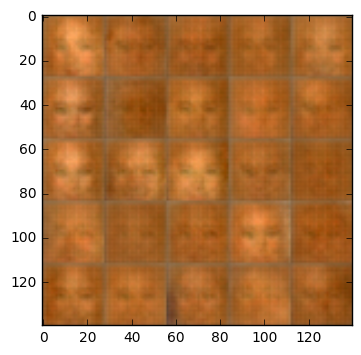

Epoch 1/1... Discriminator Loss: 1.4195... Generator Loss: 0.6744
Epoch 1/1... Discriminator Loss: 1.3862... Generator Loss: 0.6248
Epoch 1/1... Discriminator Loss: 1.3992... Generator Loss: 0.6392
Epoch 1/1... Discriminator Loss: 1.3402... Generator Loss: 0.6635
Epoch 1/1... Discriminator Loss: 1.3304... Generator Loss: 0.6473
Epoch 1/1... Discriminator Loss: 1.3071... Generator Loss: 0.6426
Epoch 1/1... Discriminator Loss: 1.2980... Generator Loss: 0.6249
Epoch 1/1... Discriminator Loss: 1.6714... Generator Loss: 0.6111
Epoch 1/1... Discriminator Loss: 1.4395... Generator Loss: 0.7411
Epoch 1/1... Discriminator Loss: 1.4796... Generator Loss: 0.6131


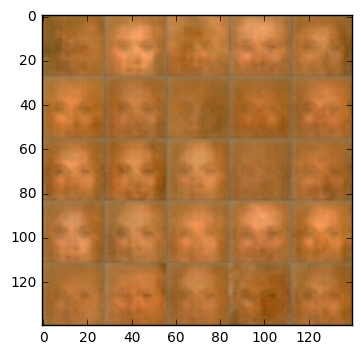

Epoch 1/1... Discriminator Loss: 1.5461... Generator Loss: 0.6425
Epoch 1/1... Discriminator Loss: 1.7641... Generator Loss: 0.6198
Epoch 1/1... Discriminator Loss: 1.4462... Generator Loss: 0.5964
Epoch 1/1... Discriminator Loss: 1.3282... Generator Loss: 0.6649
Epoch 1/1... Discriminator Loss: 1.5039... Generator Loss: 0.6400
Epoch 1/1... Discriminator Loss: 1.3762... Generator Loss: 0.6390
Epoch 1/1... Discriminator Loss: 1.2821... Generator Loss: 0.6358
Epoch 1/1... Discriminator Loss: 1.3520... Generator Loss: 0.7045
Epoch 1/1... Discriminator Loss: 1.4106... Generator Loss: 0.6565
Epoch 1/1... Discriminator Loss: 1.3901... Generator Loss: 0.6726


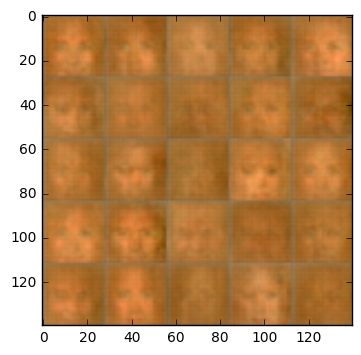

Epoch 1/1... Discriminator Loss: 1.3479... Generator Loss: 0.6671
Epoch 1/1... Discriminator Loss: 1.4798... Generator Loss: 0.6387
Epoch 1/1... Discriminator Loss: 1.4065... Generator Loss: 0.6872
Epoch 1/1... Discriminator Loss: 1.4748... Generator Loss: 0.6364
Epoch 1/1... Discriminator Loss: 1.4225... Generator Loss: 0.6774
Epoch 1/1... Discriminator Loss: 1.4592... Generator Loss: 0.6071
Epoch 1/1... Discriminator Loss: 1.3316... Generator Loss: 0.6525
Epoch 1/1... Discriminator Loss: 1.5642... Generator Loss: 0.5982
Epoch 1/1... Discriminator Loss: 1.4156... Generator Loss: 0.6660
Epoch 1/1... Discriminator Loss: 1.4380... Generator Loss: 0.6549


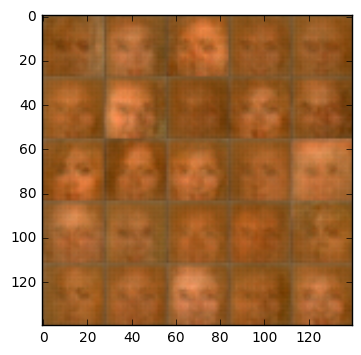

Epoch 1/1... Discriminator Loss: 1.4323... Generator Loss: 0.6509
Epoch 1/1... Discriminator Loss: 1.3815... Generator Loss: 0.6609
Epoch 1/1... Discriminator Loss: 1.3747... Generator Loss: 0.7002
Epoch 1/1... Discriminator Loss: 1.4247... Generator Loss: 0.6518
Epoch 1/1... Discriminator Loss: 1.4963... Generator Loss: 0.6304
Epoch 1/1... Discriminator Loss: 1.4248... Generator Loss: 0.6908
Epoch 1/1... Discriminator Loss: 1.4101... Generator Loss: 0.6823
Epoch 1/1... Discriminator Loss: 1.5957... Generator Loss: 0.6312
Epoch 1/1... Discriminator Loss: 1.4491... Generator Loss: 0.5986
Epoch 1/1... Discriminator Loss: 1.6439... Generator Loss: 0.5800


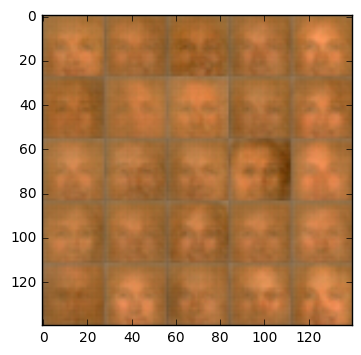

Epoch 1/1... Discriminator Loss: 1.4483... Generator Loss: 0.6757
Epoch 1/1... Discriminator Loss: 1.5241... Generator Loss: 0.5969
Epoch 1/1... Discriminator Loss: 1.3403... Generator Loss: 0.6192
Epoch 1/1... Discriminator Loss: 1.5031... Generator Loss: 0.6806
Epoch 1/1... Discriminator Loss: 1.4552... Generator Loss: 0.6266
Epoch 1/1... Discriminator Loss: 1.4371... Generator Loss: 0.6212
Epoch 1/1... Discriminator Loss: 1.4596... Generator Loss: 0.6500
Epoch 1/1... Discriminator Loss: 1.4730... Generator Loss: 0.6532
Epoch 1/1... Discriminator Loss: 1.5052... Generator Loss: 0.5867
Epoch 1/1... Discriminator Loss: 1.6407... Generator Loss: 0.5857


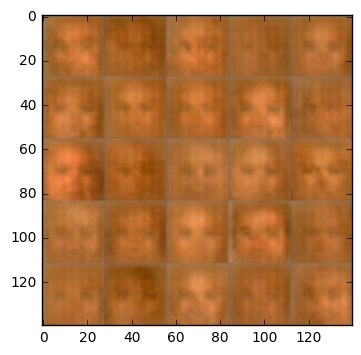

Epoch 1/1... Discriminator Loss: 1.3876... Generator Loss: 0.6683
Epoch 1/1... Discriminator Loss: 1.4265... Generator Loss: 0.6506
Epoch 1/1... Discriminator Loss: 1.4334... Generator Loss: 0.5946
Epoch 1/1... Discriminator Loss: 1.4536... Generator Loss: 0.6704


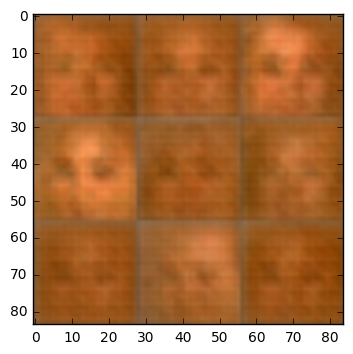

In [13]:
batch_size = 32
z_dim = 100
learning_rate = 0.0002
beta1 = 0.3
alpha = 0.1


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.